# This is the file for training the model
### Model is trained in this way  
> There are data common to each type and data not common to each type.
> 1) common data (Y1, Y2, Y3, Y4, Y9 ~ Y24, Y39, Y40, Y41, Y42, Y45, Y46, Y47)  
> 2) not common data (the others)

In [1]:
import os
import datetime
import pickle
import joblib

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D
from tensorflow.keras.layers import LSTM

from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [28]:
def y_seperate(y_feature_count=47):
    not_common_y = ['Y5','Y6','Y7','Y8','Y25','Y26','Y27','Y28','Y29','Y30','Y31','Y32','Y33','Y34','Y35','Y36','Y37','Y39','Y43','Y44']
    common_y = ['Y' + str(i) for i in range(1, y_feature_count+1) if 'Y' + str(i) not in not_common_y] 
    return not_common_y, common_y

def type_test_data(type_data='COMMON'):
    testA = ['A1','A2']
    testB = ['B9','B10','B11','B12','B13','B14','B15']
    testC = ['C39','C40']
    testD = ['D46','D47']
    testE = ['E53','E54','E55','E56']
    testF = ['F72','F73','F74','F75']
    test = testA + testB + testC + testD + testE + testF
    
    type_columns_name = {'COMMON':test, 'A':testA, 'B':testB, 'C':testC, 'D':testD, 'E':testE, 'F':testF}
    return type_columns_name[type_data]
    

def data_from_excel(file, iscommon=True, type_data='COMMON'):
    type_columns_list = {'COMMON':'C:CP', 'A':'C:K', 'B':'C, L:AO', 'C':'C, AP:AV', 'D':'C, AW:BC', 'E':'C, BD:BV', 'F':'C, BW:CP'}
    
    X = pd.read_excel(file, sheet_name='Data Sheet', skiprows=3, nrows=5, usecols=type_columns_list[type_data])
    X.rename(columns = {X.columns[0]:'id'}, inplace=True)
    X = X.set_index('id')
#     X = X.fillna(0)
    
    y = pd.read_excel(file, sheet_name='Data Sheet', skiprows=13, nrows=47, usecols=type_columns_list[type_data], thousands=',')
    y.rename(columns = {y.columns[0]:'id'}, inplace=True)
    y = y.set_index('id')
#     y = y.fillna(0)
    y = y.drop(y_seperate()[int(not iscommon)], axis=0)
    # index: 0 --> common 데이터
    # index: 1 --> type별 데이터
    return X, y


def standardization(X_train, X_test, type_data='COMMON'):
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train) 
    X_test_std = scaler.transform(X_test) 
    scaler_file_name = 'scaler' + '-' + type_data + '.pkl'
    joblib.dump(scaler, scaler_file_name)
    return X_train_std, X_test_std
    
def dataset(X, y, i, iscommon=True, type_data='COMMON'):
    type_test_data_list = type_test_data(type_data)
    X_test = X[type_test_data_list]
    X_train = X.drop(type_test_data_list,axis=1)
    y_test = y.loc[i,type_test_data_list]
    y_train = y.drop(type_test_data_list,axis=1).loc[i]
    X_train = np.array(X_train).T
    y_train = np.array(y_train).T
    X_test = np.array(X_test).T
    y_test = np.array(y_test).T
    X_train, X_test = standardization(X_train, X_test, type_data)
    X_train = X_train.reshape((X_train.shape[0],X_train.shape[1],1))
    X_test = X_test.reshape((X_test.shape[0],X_test.shape[1],1))
    return X_train, y_train, X_test, y_test

def select_model(X_train, y_train, dir_name, type_data, model_name, model_type="cnn"): 
    if model_type == "cnn":  
        model = Sequential()        
        model.add(Conv1D(filters=1, kernel_size=1, input_shape=(X_train.shape[1],X_train.shape[2]), activation='relu'))
        model.add(MaxPooling1D(pool_size=1))
        model.add(Flatten())
        model.add(Dense(50, activation='relu'))
        model.add(Dense(10, activation='relu'))
        model.add(Dense(1, activation='relu'))
        model.compile(optimizer='adam',loss='mse')
        logdir = os.path.join("logs" + os.sep + dir_name + os.sep + type_data, model_name + '-' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
        tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
        model.fit(X_train, y_train, epochs=5000, verbose=0, callbacks=[tensorboard_callback])
        model.save("save_model" + os.sep + dir_name + os.sep + type_data + os.sep + model_name)
    elif model_type == "lstm":
        model = Sequential()
        model.add(LSTM(300, input_shape=(X_train.shape[1],X_train.shape[2]), activation="relu"))
        model.add(Dense(50, activation='relu'))
        model.add(Dense(10, activation='relu'))
        model.add(Dense(1, activation='relu')) 
        model.compile(optimizer='adam',loss='mse')
        logdir = os.path.join("logs" + os.sep + dir_name + os.sep + type_data, model_name + '-' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
        tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
        model.fit(X_train, y_train, epochs=5000, verbose=0, callbacks=[tensorboard_callback])
        model.save("save_model" + os.sep + dir_name + os.sep + type_data + os.sep + model_name)
    return model

# def train_columns():
# iscommon=True, type_data='COMMON'
def train(file, model_type, iscommon=True, type_data='COMMON'):
    X, y = data_from_excel(file, iscommon=iscommon, type_data=type_data)
    type_test_data_list = type_test_data(type_data)
    type_test_data_list_number = [i for i in range(len(type_test_data_list))]

    row_list = y_seperate()             
    # not_common_row; 0 index
    # common_row : 1 index

    # yhat: predicted 
    # row: number of y feature(output)
    # col: number of samples
    # value: y value
    yhat = np.zeros(shape=(len(type_test_data_list_number), y_feature_count), dtype='double')

    # ytarget: real
    # row: number of y feature(output)
    # col: number of samples
    # value: y value
    ytarget = np.zeros(shape=(len(type_test_data_list_number), y_feature_count), dtype='double')
    acc = np.ones(shape=(y_feature_count), dtype='double')
    
    for idx in row_list[int(iscommon)]:
        i = int(idx[1:])-1

        # train the data
        print('process: ', i+1)
        X_train, y_train, X_test, y_test = dataset(X, y, idx, iscommon=iscommon, type_data=type_data)

        # train(X_train, y_train, dir_name, type_data='COMMON', model_name, model_type="cnn"): 
        model = select_model(X_train, y_train, dir_name=model_type, type_data=type_data, model_name=model_type+str(i+1), model_type=model_type)

        # test the data
        # yhat[:, i] = model.predict(X_test,verbose=0)[:, 0]
        # ytarget[:, i] = y_test

        yhat[type_test_data_list_number, i] = model.predict(X_test,verbose=0)[:, 0]
        ytarget[type_test_data_list_number, i] = y_test

        # evaluate the model
        yhat_reshape = yhat[type_test_data_list_number, i].reshape(yhat[type_test_data_list_number, i].shape[0], 1)
        ytarget_reshape = ytarget[type_test_data_list_number, i].reshape(ytarget[type_test_data_list_number, i].shape[0], 1)
        error = calculate_error(yhat_reshape, ytarget_reshape)
        acc_value = 1-error
        acc[i] = acc_value     
    return yhat, ytarget, acc


def calculate_error(yhat, ytarget):
    temp = np.concatenate([yhat,ytarget])
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(temp)
    yhat_scaled = scaled[:yhat.shape[0]]
    ytarget_scaled = scaled[ytarget.shape[0]:]
    error = mean_squared_error(yhat_scaled, ytarget_scaled)
    return error

def plot_accuracy(acc, type_data):
    plt.figure(figsize=(20, 10))
    plt.plot([i for i in range(1, len(acc)+1)], acc, lw=3, color='#e35f62', marker='o', label='Accuracy')
    plt.title('[' + type_data + '] ' + 'Accuracy' , fontsize=20)
    plt.xticks(rotation=90)
    plt.xticks([i for i in range(1, len(acc)+1)],['Y' + str(i) for i in range(1, len(acc)+1)], fontsize=15)
    plt.yticks(np.arange(0,1.05,0.05), fontsize=15)
    plt.xlabel('Feature Index (Y)', fontsize=20, labelpad=7) # y1, y2 ....
    plt.ylabel('Accuracy', fontsize=20)
    plt.xlim([0, len(acc)+1])
    plt.ylim([0, 1])
    plt.legend(fontsize=15)
    plt.tight_layout()
    plt.savefig('plot_train' + os.sep + model_type + os.sep + 'accuracy' + os.sep + '[' + type_data + '] ' + 'accuracy.png')
    
def plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data):
    if type_data == "COMMON": total_row = y_seperate()[1]
    else: total_row = y_seperate()[0]

    test_data = type_test_data(type_data)
    
    for idx in total_row:
        i = int(idx[1:])-1   

        plt.figure(figsize=(20, 10))

        # 예측값
        plt.plot([i for i in range(1, ytarget.shape[0]+1)],yhat[:,i], lw=3, color='#e35f62', marker='o', label='Predict Value')

        # 실제값
        plt.plot([i for i in range(1, ytarget.shape[0]+1)],ytarget[:,i], lw=3, color='#1f77b4', marker='x', label='Real Value')

        plt.grid(True, axis='y', linestyle='--')

        plt.title('Feature Number ' + idx + 
                  ' (Accuracy: ' + "{:.3f}".format(acc[i]*100) + '(%))', fontsize=20)
        plt.xticks([i for i in range(1, ytarget.shape[0]+1)],[test_data[i] for i in range(0, len(test_data))], fontsize=15)
        # plt.xticks(np.arange(1, test_sample_count + 1, 1), fontsize=15)
        plt.yticks(np.arange(-20000, 200001, 10000), fontsize=15)
        plt.xlabel('Test Sample Data (A ~ F)', fontsize=20) # a1, a2 ....
        plt.ylabel('Feature Value', fontsize=20)
        plt.xlim([0, ytarget.shape[0]+1])
        plt.ylim([-20000, 200000])
        plt.legend(fontsize=15)
        plt.tight_layout()
        # plt.show()

        plt.savefig('plot_train' + os.sep  + model_type + os.sep + 'y_value_for_test_sample_count' + \
                    os.sep + '[' + type_data + '] ' + idx + '.png')


def plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data):
    not_common_row, common_row = y_seperate()
    total_row = common_row + not_common_row
    total_row_num = [int(i[1:]) for i in total_row]
    total_row_num = sorted(total_row_num)
    total_row_list = ['Y' + str(i) for i in total_row_num]
    
    test_data = type_test_data(type_data)
    
    for i, idx in enumerate(test_data):   
        plt.figure(figsize=(20, 10))

        # 예측값
        plt.plot([i for i in range(1, ytarget.shape[1]+1)],yhat[i,:], lw=3, color='#e35f62', marker='o', label='Predict Value')

        # 실제값
        plt.plot([i for i in range(1, ytarget.shape[1]+1)],ytarget[i,:], lw=3, color='#1f77b4', marker='x', label='Real Value')

        plt.grid(True, axis='y', linestyle='--')

        plt.title('Test Sample Number ' + idx, fontsize=20)
        # plt.xticks(np.arange(1, y_feature_count + 1, 1), fontsize=15)
        plt.xticks(rotation=90)
        plt.xticks([i for i in range(1, ytarget.shape[1]+1)],[i for i in total_row_list], fontsize=15)
        plt.yticks(np.arange(-20000, 200001, 10000), fontsize=15)
        plt.xlabel('Feature index (Y)', fontsize=20, labelpad=7) # y1, y2 ....
        plt.ylabel('Feature Value', fontsize=20)
        plt.xlim([0, ytarget.shape[1]+1])
        plt.ylim([-20000, 200000])
        plt.legend(fontsize=15)
        plt.tight_layout()
        # plt.show()

        plt.savefig('plot_train' + os.sep  + model_type + os.sep + 'y_value_for_y_feature_count' + \
                    os.sep + '[' + type_data + '] ' + idx + '.png')

In [29]:
train_sample_count = 70
test_sample_count = 21
X_feature_count = 5
y_feature_count = 47

## 0) Checking the data before training the model

In [30]:
file = '../data_v2/DB(R0_H_R1 211012).xlsx'

X, y = data_from_excel(file)
#X, y = standardization(X, y)
X

,A1,A2,A3,A4,A5,A6,A7,A8,B9,B10,...,F82,F83,F84,F85,F86,F87,F88,F89,F90,F91
id,,,,,,,,,,,,,,,,,,,,,
X1,226.0,226.0,226.0,226.0,226.0,224.5,178.0,229.0,285.4,285.4,...,336.0,333.0,336.0,336.0,336.0,336.0,336.0,336.0,277.0,336.0
X2,219.0,219.0,219.0,215.0,215.0,213.0,170.0,223.0,274.4,274.4,...,325.0,320.0,330.0,330.0,330.0,330.0,330.0,330.0,264.5,330.0
X3,36.6,36.6,36.6,36.6,36.6,36.0,28.0,36.6,43.4,43.4,...,60.0,60.0,60.0,60.0,60.0,60.0,60.0,60.0,46.0,60.0
X4,22.2,22.2,22.2,22.2,22.2,22.3,17.7,23.6,26.0,26.0,...,29.5,30.5,30.5,29.5,30.5,30.5,29.5,29.5,22.9,29.5
X5,11.8,11.8,11.8,11.8,11.8,11.7,10.2,12.2,12.5,12.5,...,21.6,22.5,22.5,21.6,22.5,22.5,21.6,21.6,14.9,21.7


In [31]:
np.where(np.isnan(X))

(array([], dtype=int64), array([], dtype=int64))

In [32]:
y

,A1,A2,A3,A4,A5,A6,A7,A8,B9,B10,...,F82,F83,F84,F85,F86,F87,F88,F89,F90,F91
id,,,,,,,,,,,,,,,,,,,,,
Y1,5714,5842,5841,5960.9,5908.3,5845.0,3413.8,5638.0,9198,9099.5,...,14173.6,14224.6,14557.3,13692.1,14800,14204.0,13676.8,13676.8,9505.9,13459.9
Y2,5044,5167,5399,5143.0,5139.0,5255.0,3744.5,6021.0,7900,8423.8,...,16361.6,16285.9,16545.8,16442.6,16800,16998.0,16441.4,16452.3,11485.1,16300.6
Y3,4942,4932,5076,5062.0,5058.8,4635.0,2940.3,5604.0,8795,4117.0,...,6650.4,6297.6,6080.9,5816.3,6200,5900.0,5834.4,5845.1,5756.0,5742.3
Y4,8123,8058,7564,8704.0,8218.0,7729.0,5955.7,9256.0,11672,10183.8,...,18018.1,17942.5,17870.6,17597.0,18100,17708.0,17766.2,17766.2,15199.5,17548.2
Y9,2599,2456,2688,2556.0,2544.0,2652.0,2687.9,2380.5,3903,3900.9,...,4127.7,3493.6,4275.5,4080.9,4300,4351.0,4088.9,4088.9,5194.6,3959.4
Y10,1421,1144,1264,896.0,869.1,902.0,683.1,1175.8,2214,2148.9,...,836.9,884.1,1089.1,1606.1,1100,1619.0,1606.1,1606.1,2265.5,1813.9
Y11,214,183,238,259.0,253.0,55.0,365.9,248.4,342,0.0,...,522.9,609.8,578.7,734.5,600,840.0,734.5,734.5,405.1,973.5
Y12,5274,5857,6171,6348.0,6616.0,5766.1,5178.3,6105.2,11486,11536.4,...,7300.6,9237.8,7904.1,7304.8,8000,8975.3,7304.8,7304.8,9549.3,7491.2
Y13,1558,1274,1127,1868.0,1733.2,2311.7,524.5,1044.3,2744,2829.1,...,3095.9,2858.5,4100.6,1767.8,4200,2619.7,1971.2,1971.2,3426.4,2367.9


In [33]:
np.where(np.isnan(y))

(array([], dtype=int64), array([], dtype=int64))

In [34]:
X_train, y_train, X_test, y_test = dataset(X, y, 'Y1')
X_train

array([[[-1.64183819],
        [-1.61827433],
        [-1.61126547],
        [-1.49376741],
        [-1.00298496]],

       [[-1.64183819],
        [-1.69952742],
        [-1.61126547],
        [-1.49376741],
        [-1.00298496]],

       [[-1.64183819],
        [-1.69952742],
        [-1.61126547],
        [-1.49376741],
        [-1.00298496]],

       [[-1.67135583],
        [-1.74015396],
        [-1.68660351],
        [-1.46220577],
        [-1.03191325]],

       [[-2.58640244],
        [-2.61362471],
        [-2.69111074],
        [-2.91404129],
        [-1.46583752]],

       [[-1.58280293],
        [-1.53702123],
        [-1.61126547],
        [-1.05190443],
        [-0.88727182]],

       [[-0.41784036],
        [-0.43604182],
        [-0.75743433],
        [-0.29442503],
        [-0.7426304 ]],

       [[-0.36274078],
        [-0.37916466],
        [-0.75743433],
        [-0.13661682],
        [-0.68477383]],

       [[-0.3824192 ],
        [-0.39947793],
        [-0.682096

In [35]:
y_train

array([ 5841.        ,  5960.9       ,  5908.3       ,  5845.        ,
        3413.8       ,  5638.        ,  8733.2       ,  8573.        ,
        8815.9       ,  9761.5       ,  9767.        ,  9168.3       ,
        9672.        , 10007.        , 10145.        , 11619.        ,
        9897.7       , 12793.3       ,  7163.        , 10016.6       ,
        9876.6       , 10189.        ,  9989.8       ,  9796.2       ,
       10350.2       , 10132.        ,  9315.1       ,  9346.7       ,
        9718.8       , 10011.        , 13481.        , 10189.4       ,
        9936.5       , 20560.5       , 10547.32150242, 10140.2       ,
        5983.8       ,  4645.9       , 17467.6       ,  7767.7       ,
        7935.8       ,  9609.6       ,  9526.9       ,  9846.        ,
       10403.5       , 11595.5       ,  9083.6       , 12336.9       ,
       14999.1       , 13898.1       , 13967.        , 14304.        ,
       14867.        , 14462.6       , 10933.        ,  7865.1       ,
      

In [36]:
X_test

array([[[-1.64183819],
        [-1.61827433],
        [-1.61126547],
        [-1.49376741],
        [-1.00298496]],

       [[-1.64183819],
        [-1.61827433],
        [-1.61126547],
        [-1.49376741],
        [-1.00298496]],

       [[-0.47293994],
        [-0.49291899],
        [-0.75743433],
        [-0.29442503],
        [-0.80048697]],

       [[-0.47293994],
        [-0.49291899],
        [-0.75743433],
        [-0.29442503],
        [-0.80048697]],

       [[-0.63823869],
        [-0.66355048],
        [-0.75743433],
        [-0.29442503],
        [-0.91620011]],

       [[-0.41784036],
        [-0.43604182],
        [-0.75743433],
        [-0.29442503],
        [-0.65584554]],

       [[-0.47293994],
        [-0.49291899],
        [-0.75743433],
        [-0.29442503],
        [-0.80048697]],

       [[-0.28402709],
        [-0.29791156],
        [-0.75743433],
        [-0.29442503],
        [-0.80048697]],

       [[-0.47293994],
        [-0.49291899],
        [-0.757434

In [37]:
y_test

array([5714.        , 5842.        , 9198.        , 9099.5       ,
       8639.1       , 7864.        , 8233.6       , 9462.8       ,
       8410.8       , 9280.91756623, 9296.9       , 5840.3       ,
       9844.7       , 6866.1       , 7526.9       , 7486.3       ,
       8331.1       , 6061.8       , 8699.4       , 8716.1       ,
       7495.        ])

In [38]:
X, y = data_from_excel(file, iscommon=False, type_data='A')
X

,A1,A2,A3,A4,A5,A6,A7,A8
id,,,,,,,,
X1,226.0,226.0,226.0,226.0,226.0,224.5,178.0,229.0
X2,219.0,219.0,219.0,215.0,215.0,213.0,170.0,223.0
X3,36.6,36.6,36.6,36.6,36.6,36.0,28.0,36.6
X4,22.2,22.2,22.2,22.2,22.2,22.3,17.7,23.6
X5,11.8,11.8,11.8,11.8,11.8,11.7,10.2,12.2


In [39]:
y

,A1,A2,A3,A4,A5,A6,A7,A8
id,,,,,,,,
Y5,0,0,0,0.0,0.0,0.0,0.0,0.0
Y6,0,0,0,0.0,0.0,0.0,0.0,0.0
Y7,0,0,0,0.0,0.0,0.0,0.0,0.0
Y8,0,0,0,0.0,0.0,0.0,0.0,0.0
Y25,39878,39686,39535,38975.0,37351.4,38524.0,20218.4,40278.7
Y26,0,0,0,0.0,0.0,0.0,0.0,0.0
Y27,0,0,0,0.0,0.0,0.0,0.0,0.0
Y28,0,0,0,0.0,0.0,0.0,0.0,0.0
Y29,0,0,0,0.0,0.0,0.0,0.0,0.0


In [40]:
X_train, y_train, X_test, y_test = dataset(X, y, 'Y5', iscommon=False, type_data='A')
X_train

array([[[ 0.42935629],
        [ 0.55188412],
        [ 0.48402285],
        [ 0.269061  ],
        [ 0.33918173]],

       [[ 0.42935629],
        [ 0.32738888],
        [ 0.48402285],
        [ 0.269061  ],
        [ 0.33918173]],

       [[ 0.42935629],
        [ 0.32738888],
        [ 0.48402285],
        [ 0.269061  ],
        [ 0.33918173]],

       [[ 0.34625507],
        [ 0.21514127],
        [ 0.29462261],
        [ 0.3228732 ],
        [ 0.18263632]],

       [[-2.22988268],
        [-2.1981825 ],
        [-2.23071402],
        [-2.15248801],
        [-2.16554491]],

       [[ 0.59555873],
        [ 0.77637935],
        [ 0.48402285],
        [ 1.0224318 ],
        [ 0.96536339]]])

In [41]:
y_train

array([0., 0., 0., 0., 0., 0.])

In [42]:
X_test

array([[[0.42935629],
        [0.55188412],
        [0.48402285],
        [0.269061  ],
        [0.33918173]],

       [[0.42935629],
        [0.55188412],
        [0.48402285],
        [0.269061  ],
        [0.33918173]]])

In [43]:
y_test.shape

(2,)

## 1) Training the common data

In [44]:
# common data
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'COMMON'

yhat, ytarget, acc  = train(file, model_type=model_type, iscommon=True, type_data=type_data)

process:  1
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn1\assets
process:  2
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn2\assets
process:  3
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn3\assets
process:  4
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn4\assets
process:  9
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn9\assets
process:  10
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn10\assets
process:  11
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn11\assets
process:  12
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn12\assets
process:  13
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn13\assets
process:  14
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn14\assets
process:  15
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn15\assets
process:  16
INFO:tensorflow:Assets written to: save_model\cnn\COMMON\cnn16\assets
process:  17
I

In [45]:
acc

array([0.32385113, 0.97777536, 0.95678788, 0.41061961, 1.        ,
       1.        , 1.        , 1.        , 0.96004615, 0.95026343,
       0.61568546, 0.97746885, 0.63157823, 0.96806692, 0.49073637,
       0.76642249, 0.71993664, 0.82436212, 0.93594778, 0.40008116,
       0.9709111 , 0.95300181, 0.69341968, 0.67384036, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 0.95650775, 1.        , 0.58282219,
       0.79578608, 0.95618656, 1.        , 1.        , 0.57159771,
       0.97126289, 0.93783526])

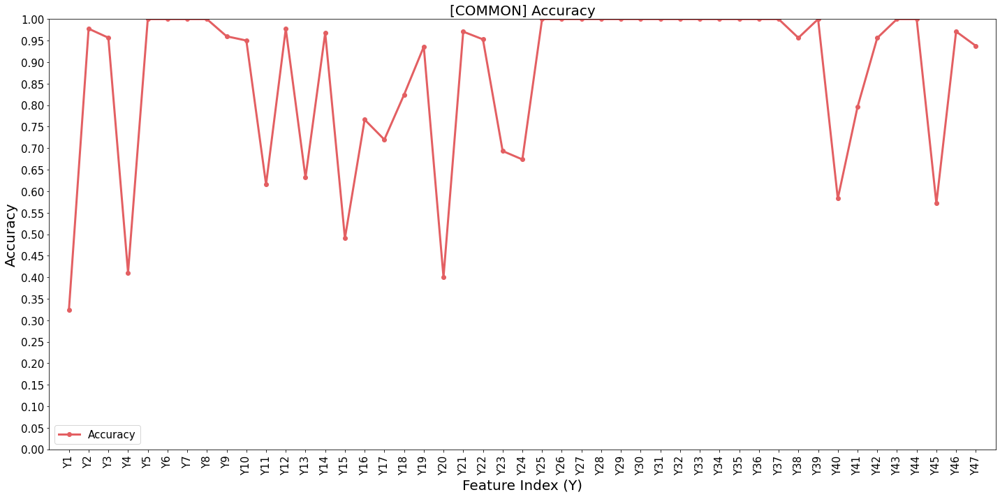

In [46]:
plot_accuracy(acc, type_data=type_data)

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


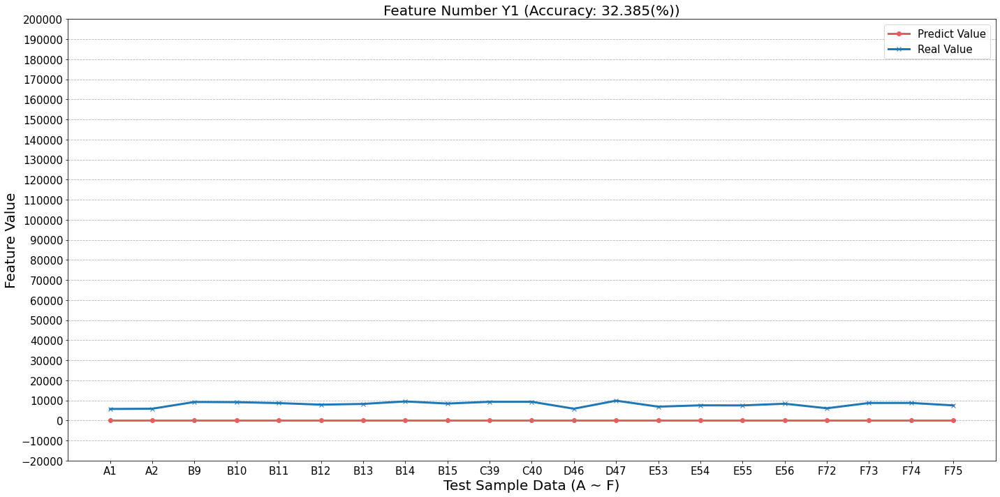

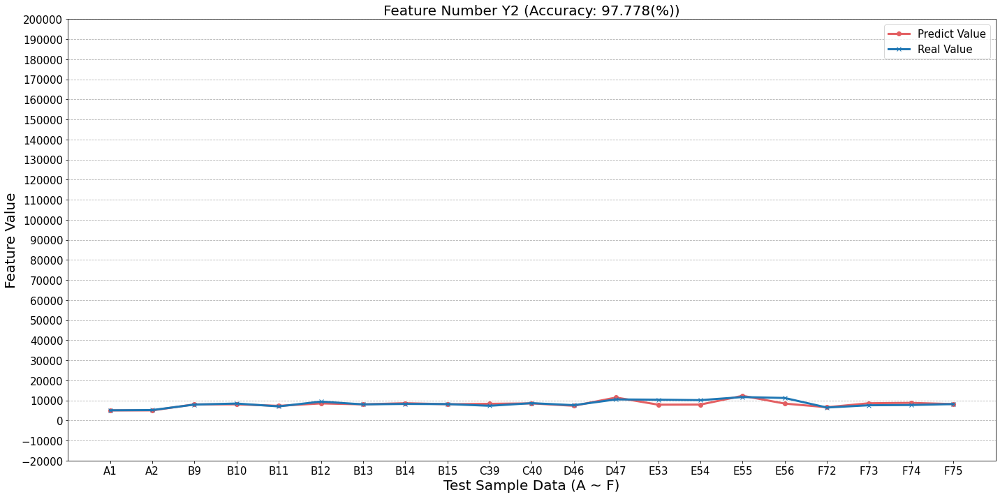

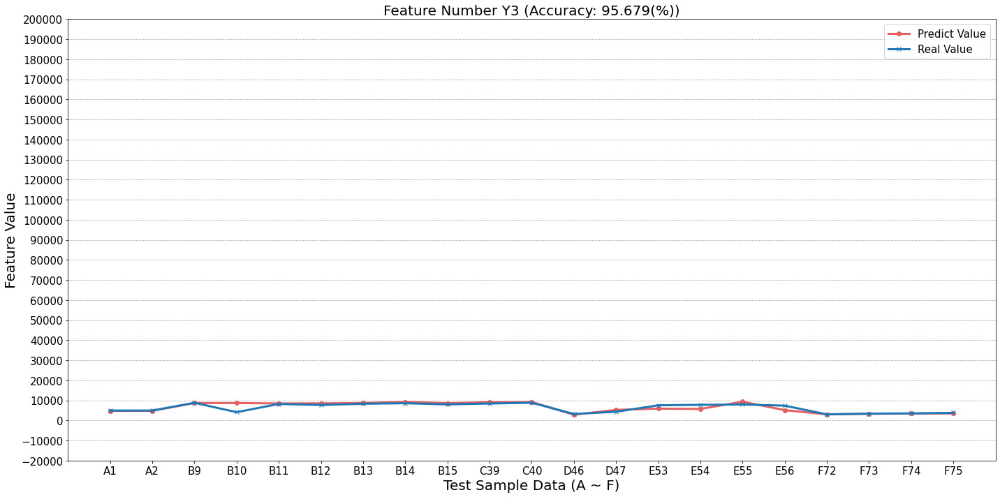

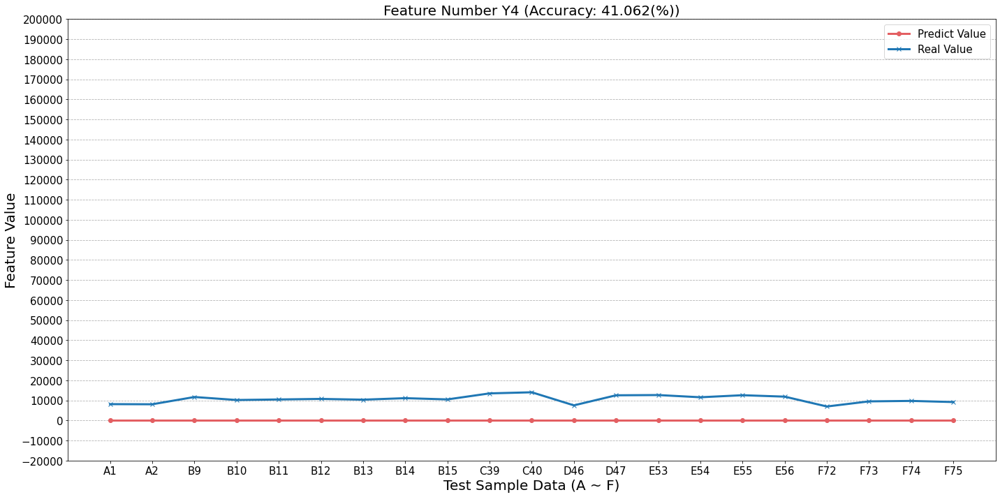

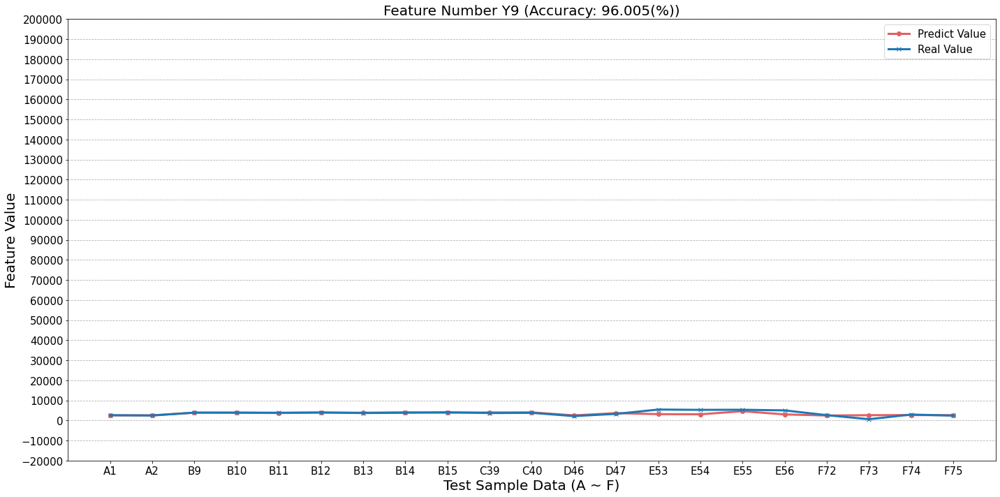

...

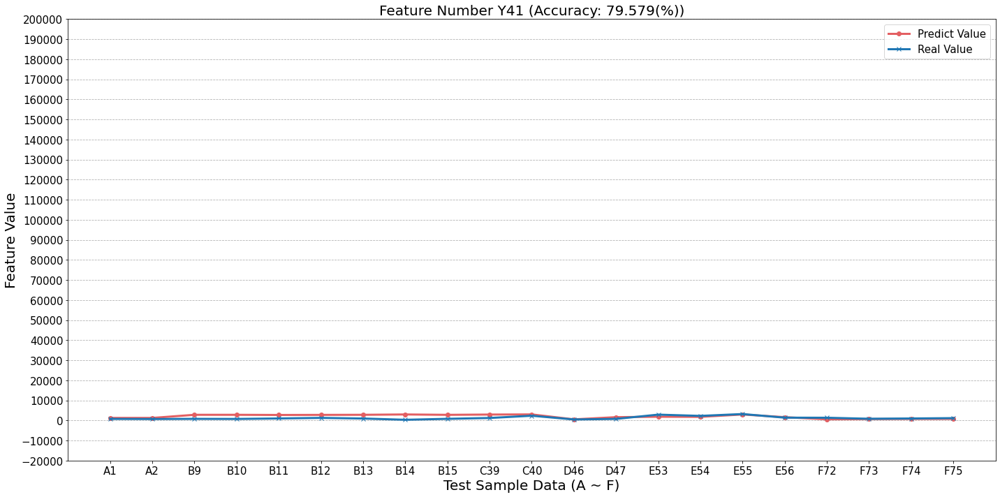

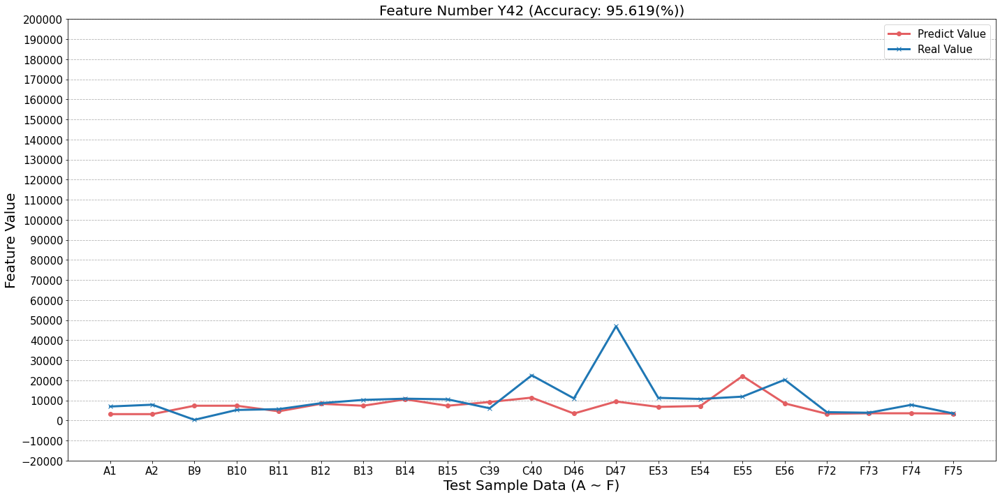

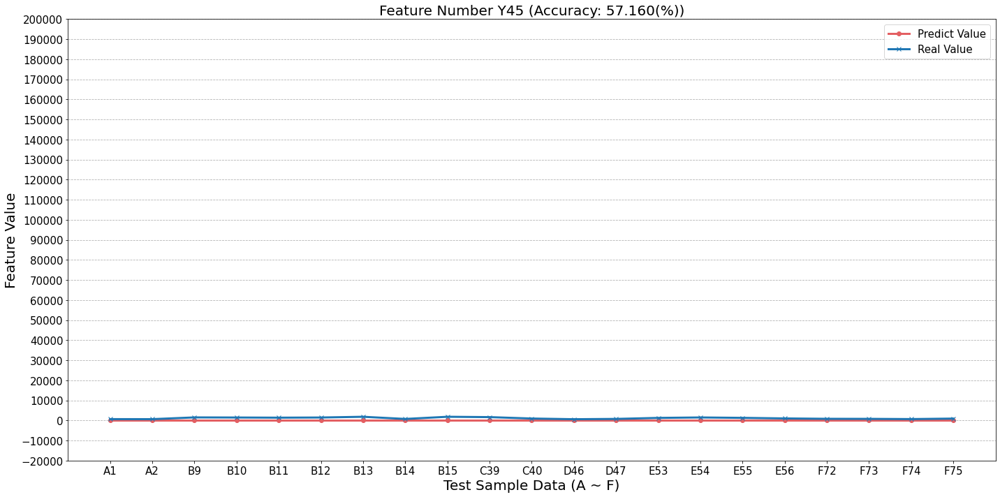

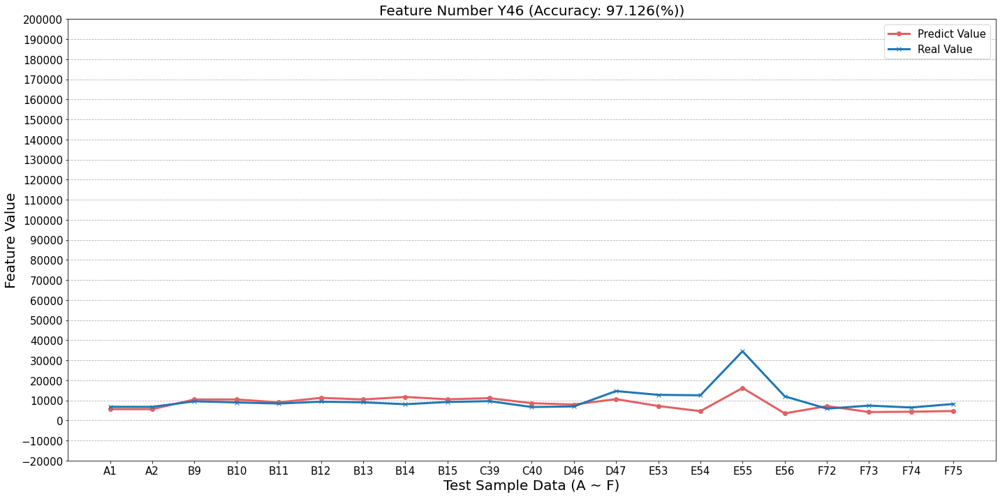

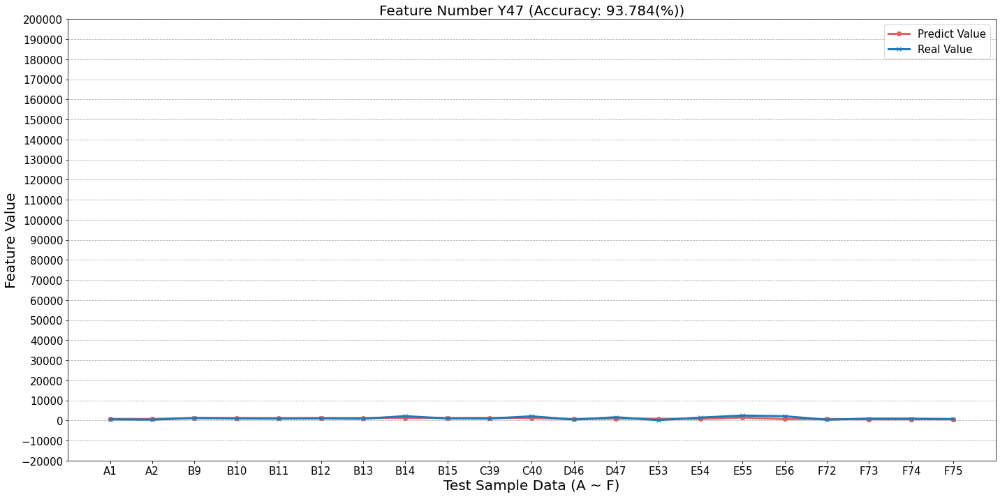

In [47]:
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)

<ipython-input-28-881ed2bdc76a>:207: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


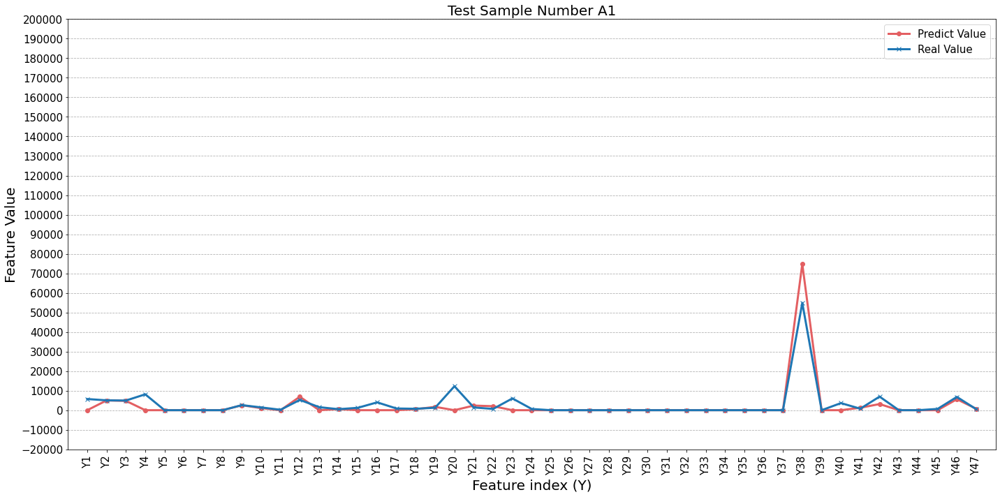

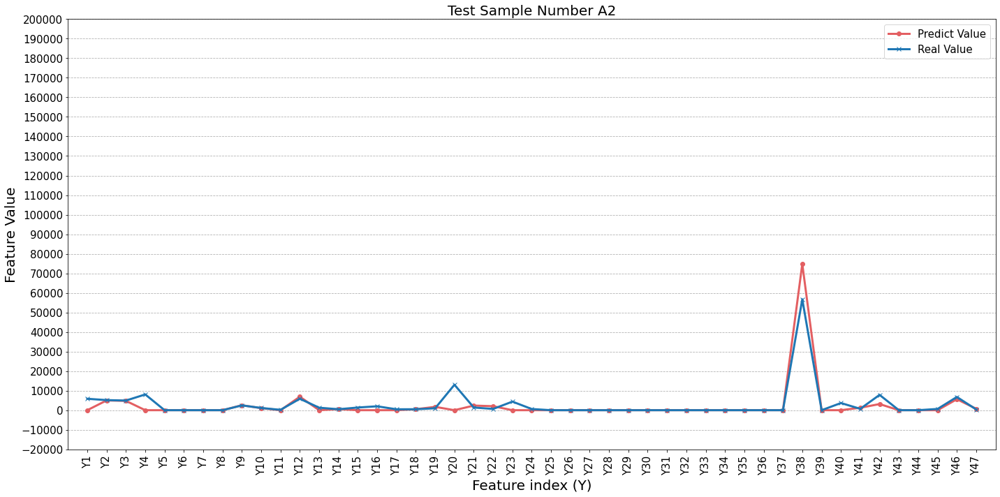

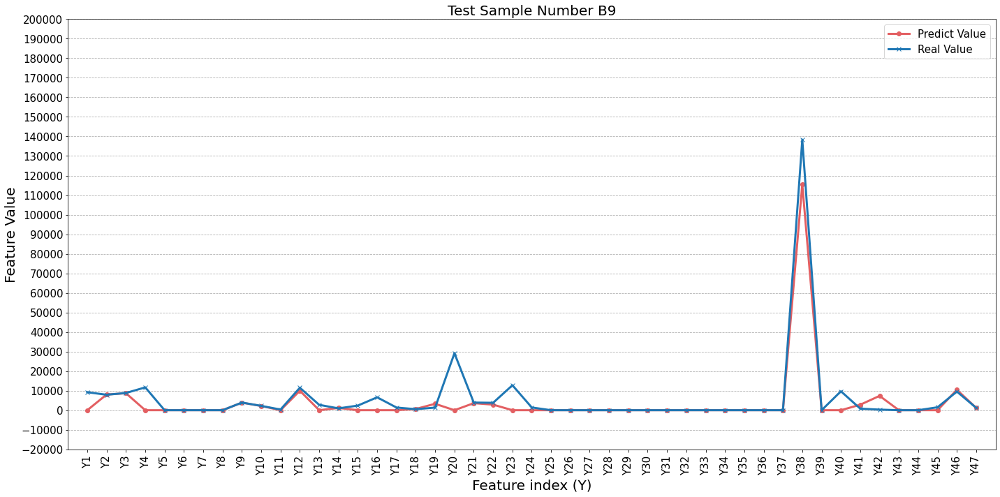

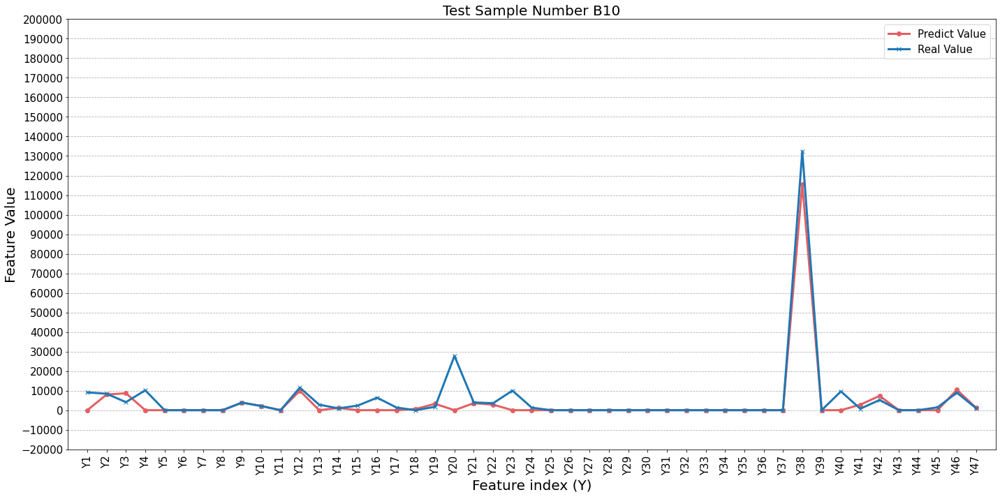

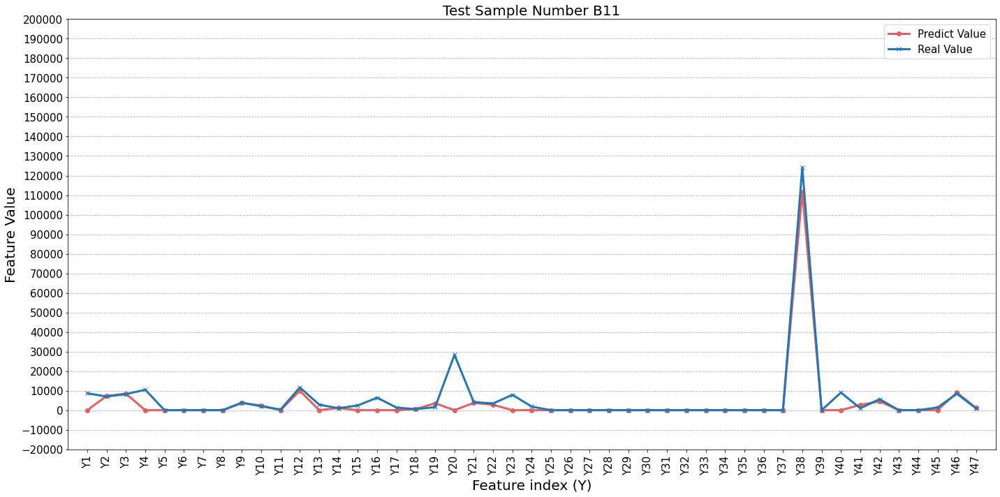

...

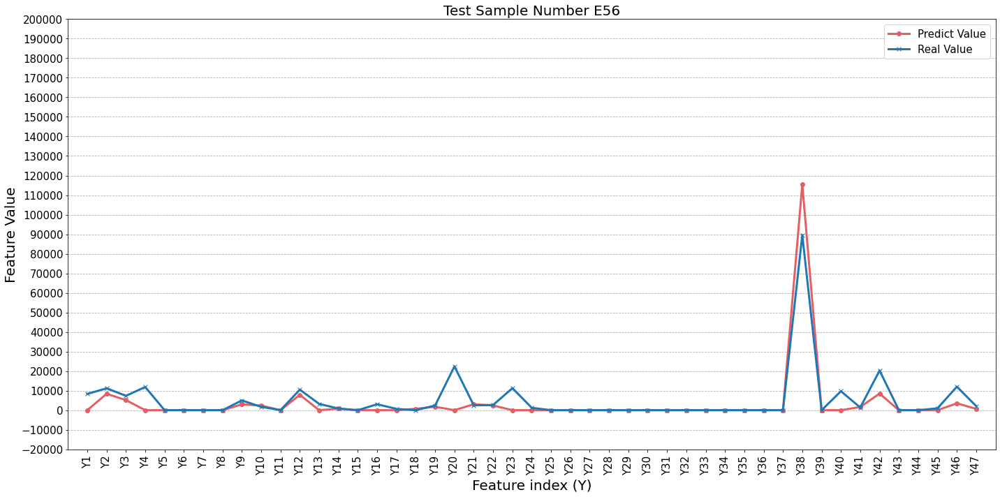

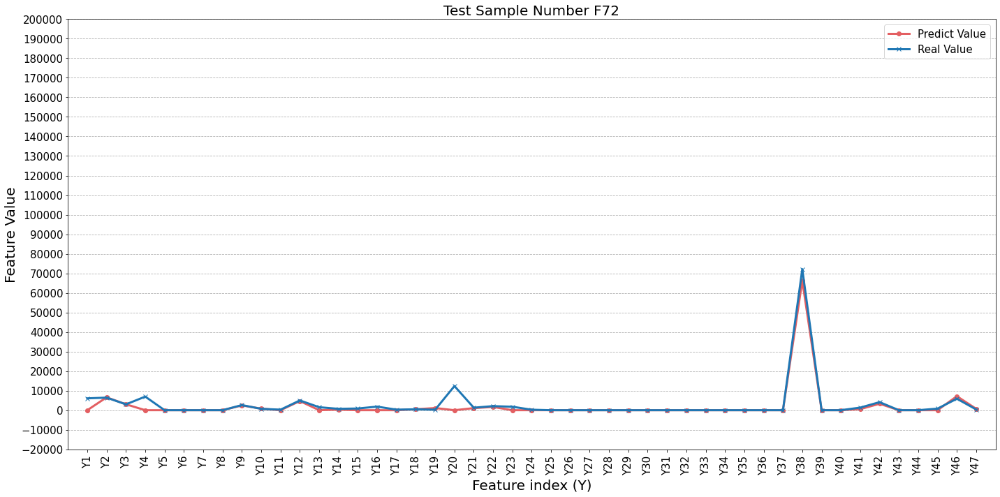

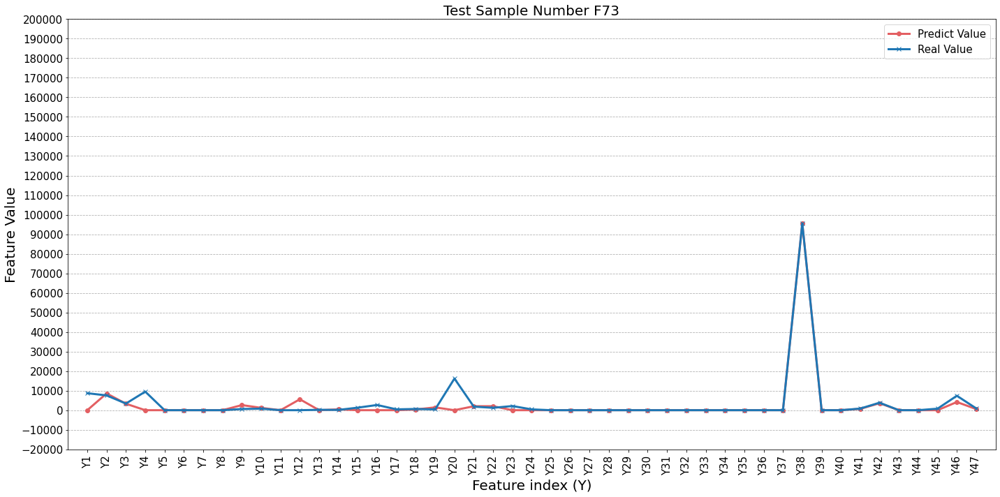

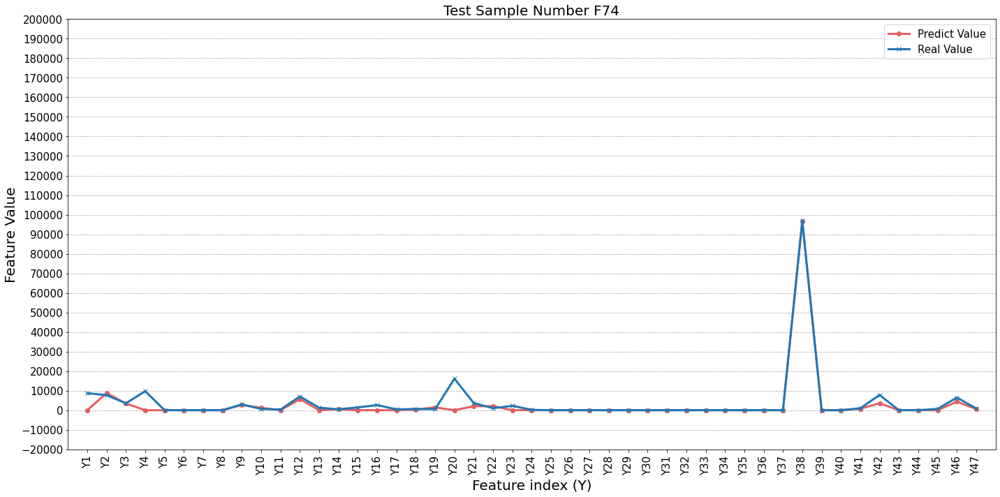

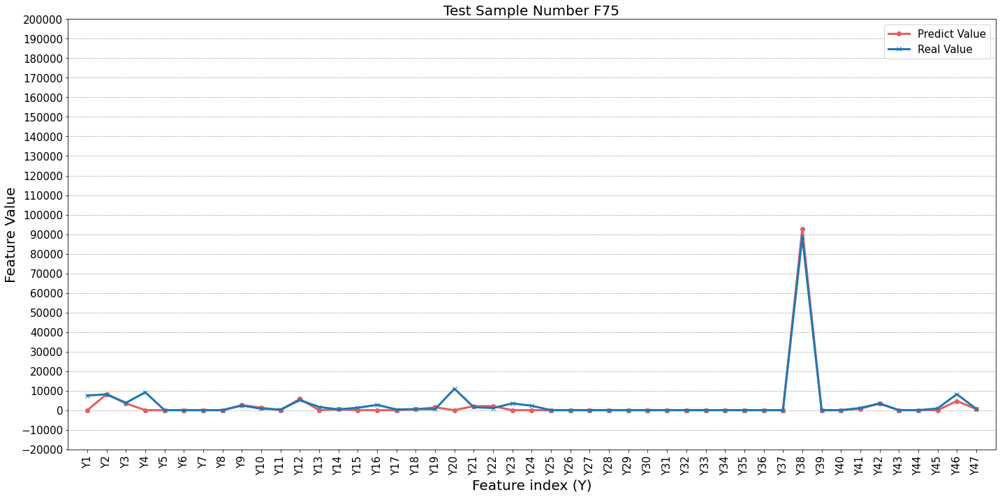

In [48]:
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 2) Training the type 'A' data

In [49]:
# A type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'A'
# train(file, model_type, iscommon=True, type_data='COMMON'):
yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\A\cnn33\a

In [50]:
yhat.shape

(2, 47)

In [51]:
ytarget.shape

(2, 47)

In [52]:
acc.shape

(47,)

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


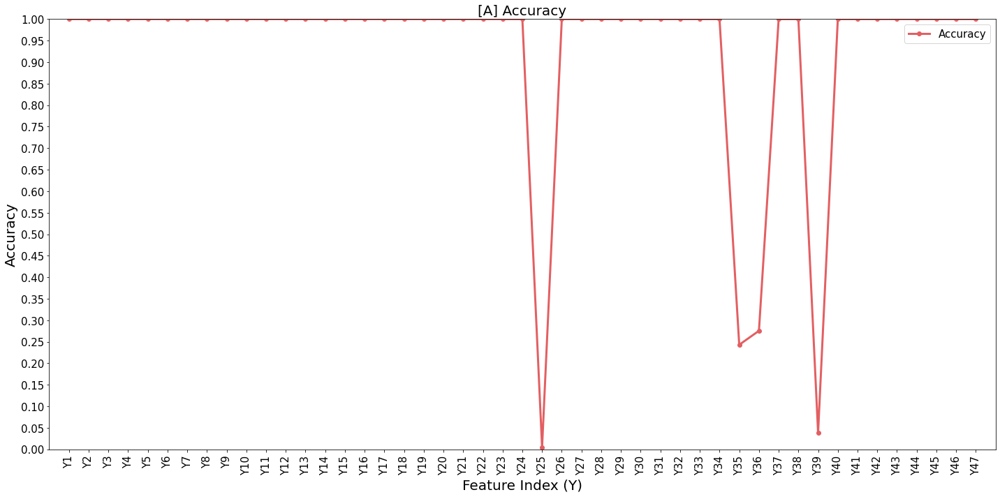

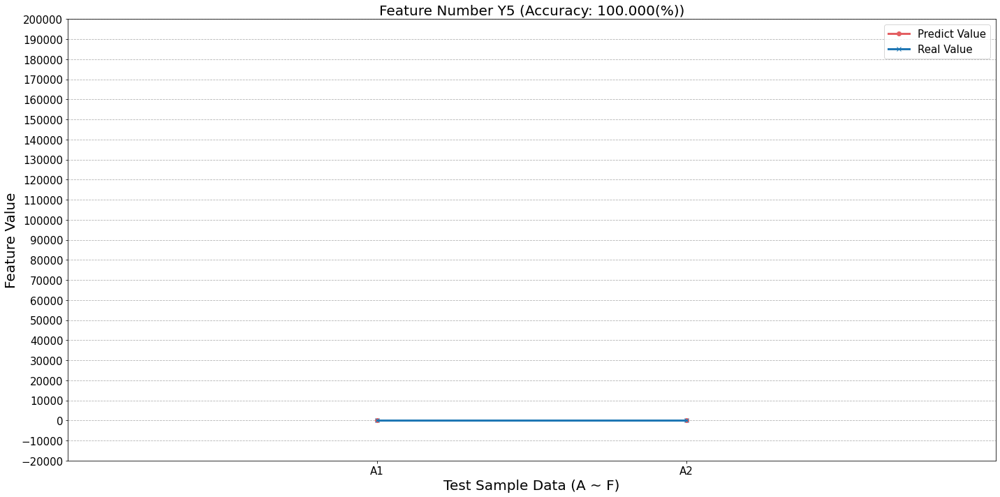

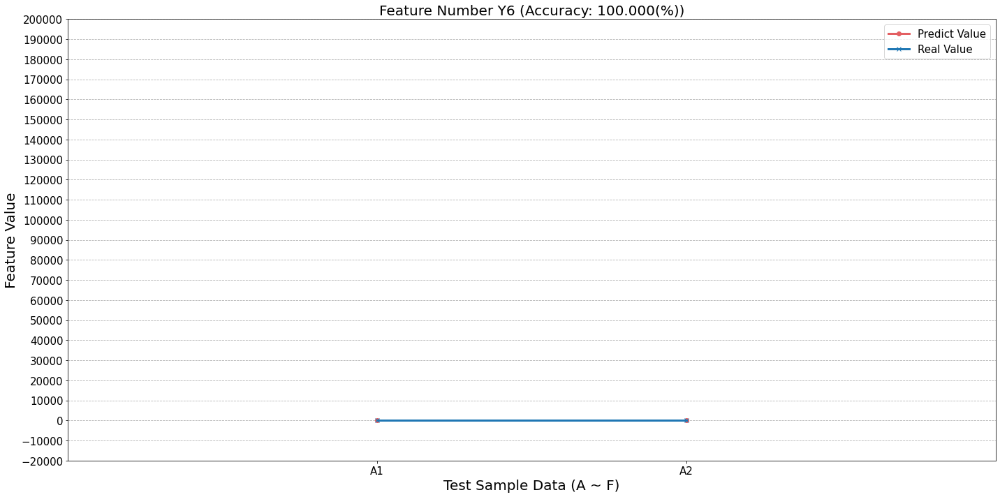

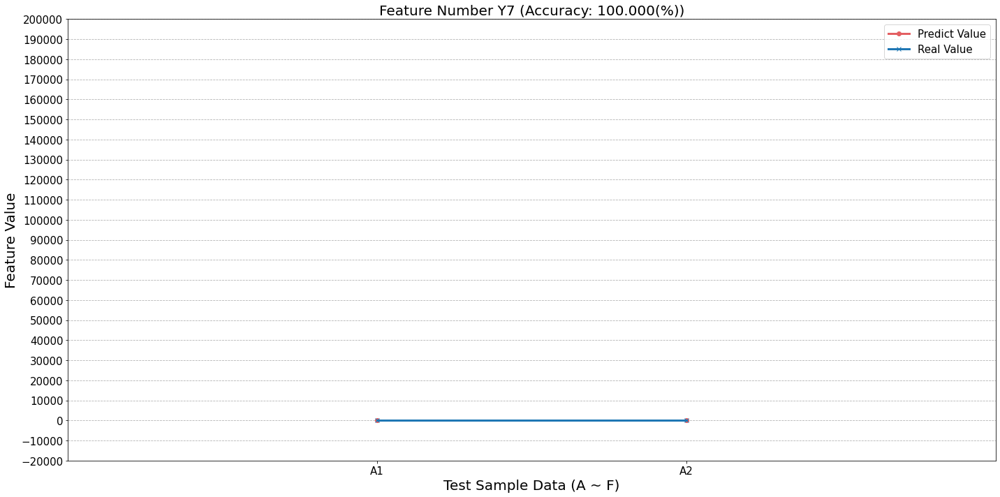

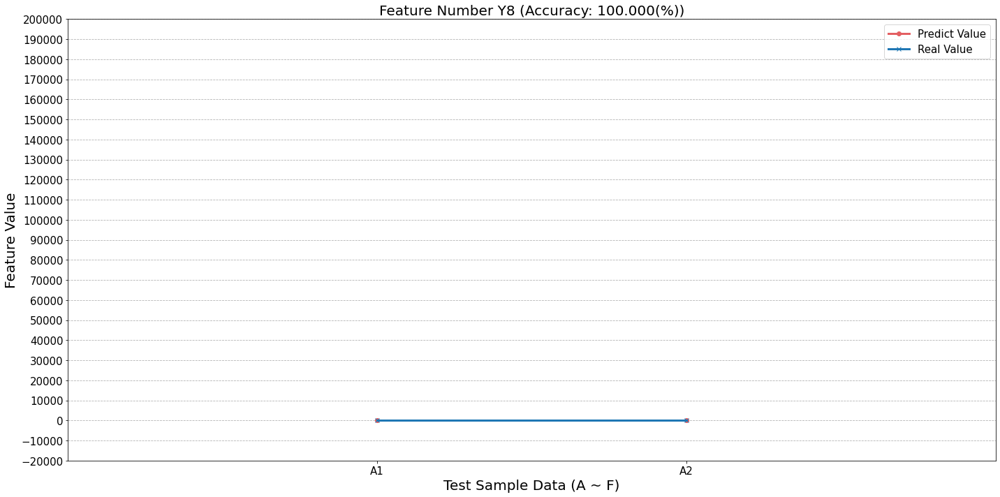

...

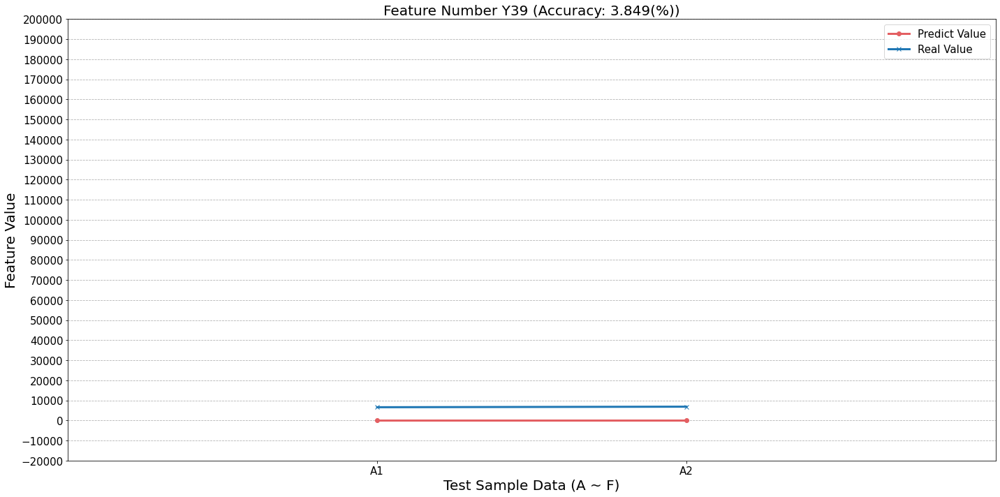

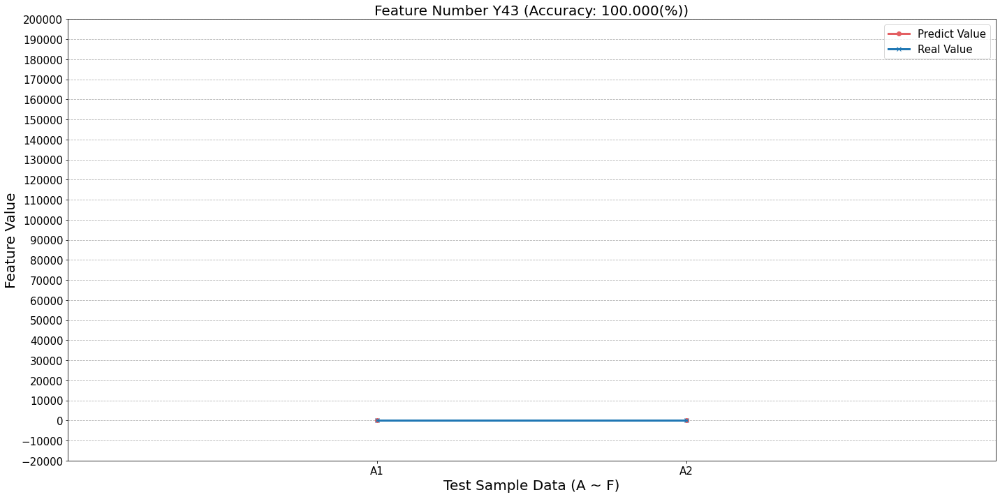

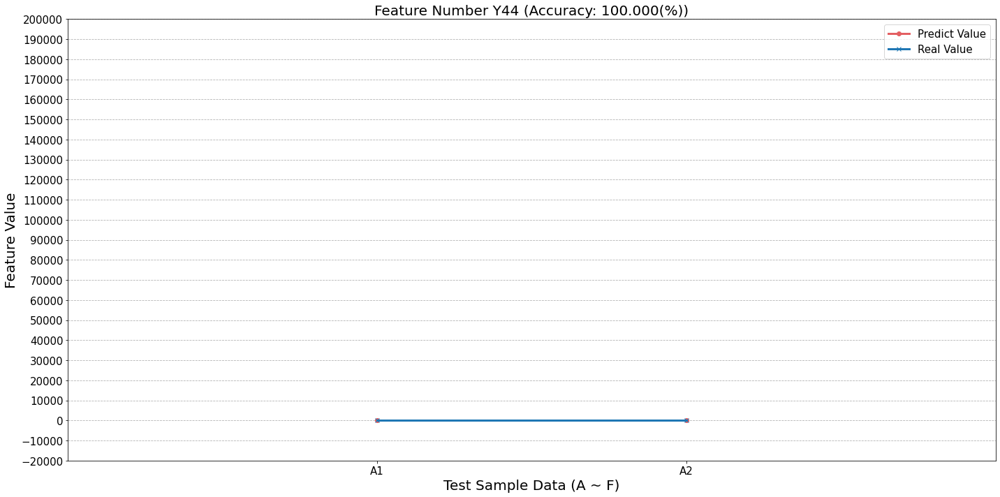

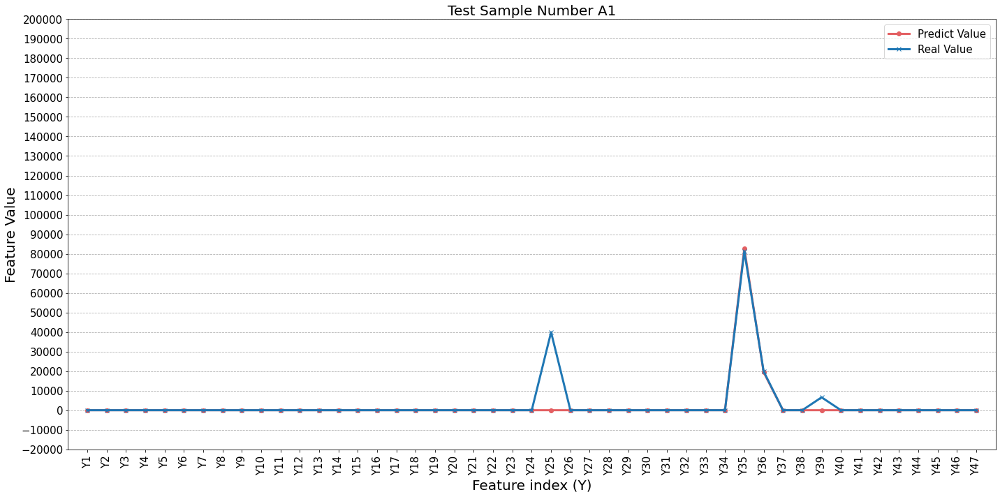

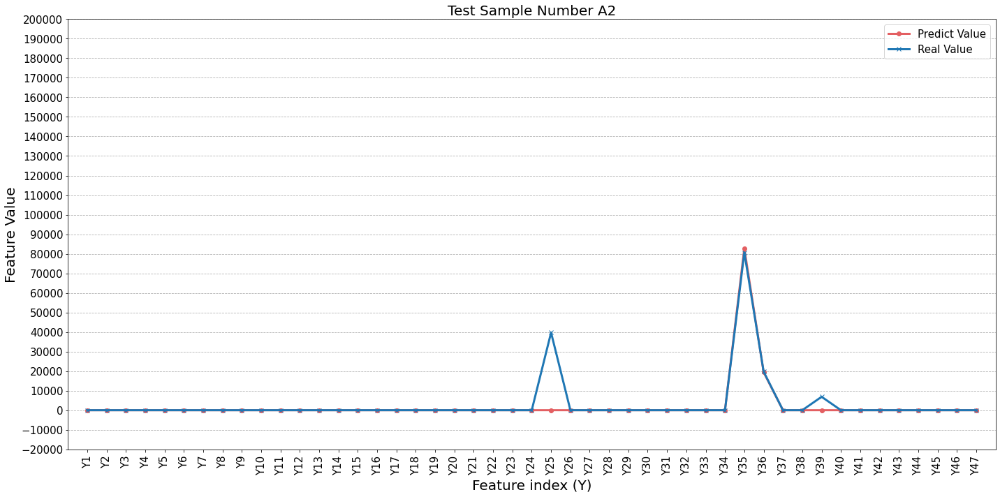

In [53]:
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 3) Training the type 'B' data

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\B\cnn33\a

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


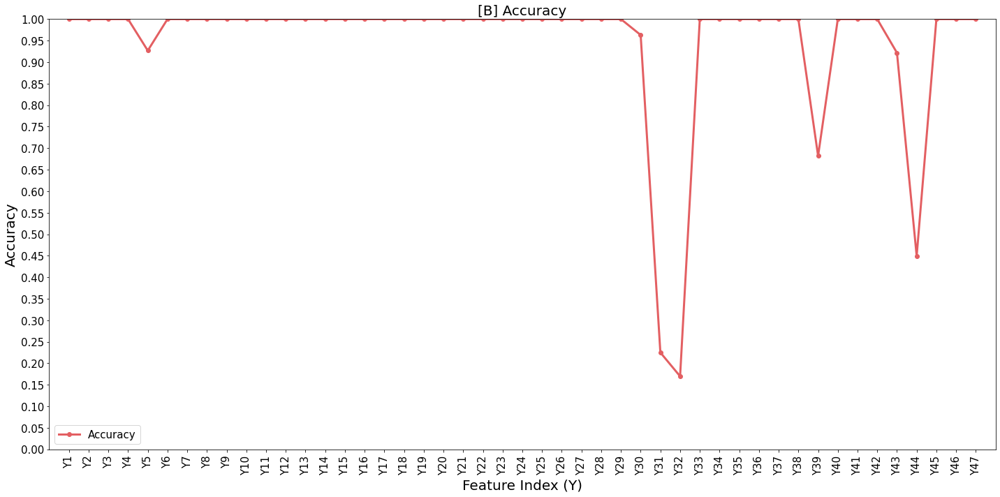

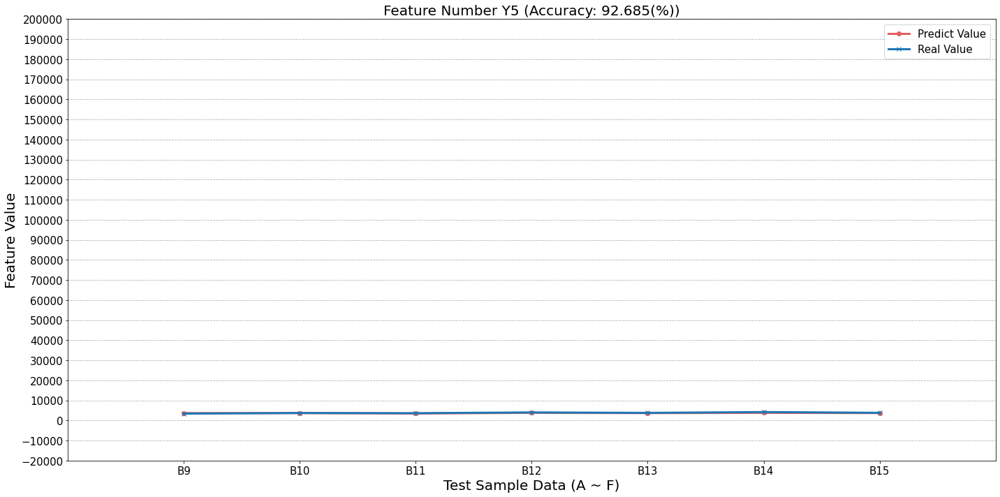

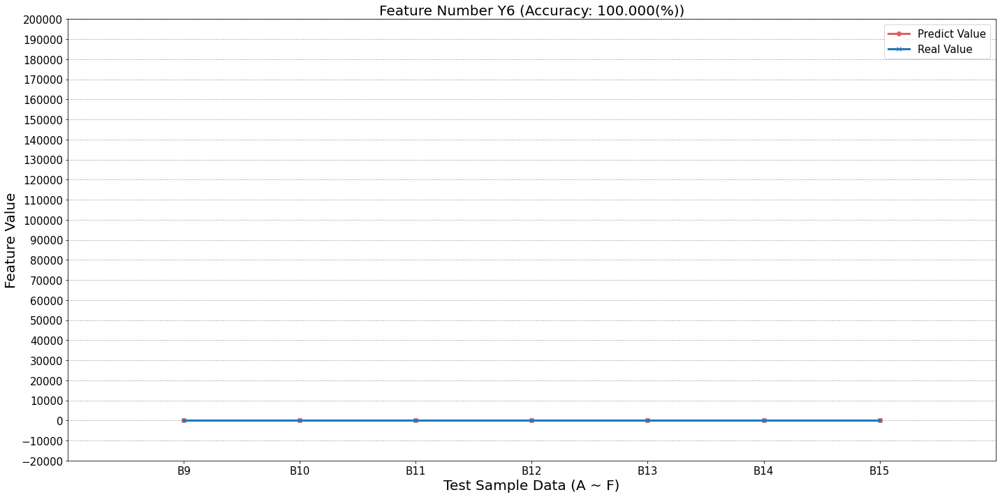

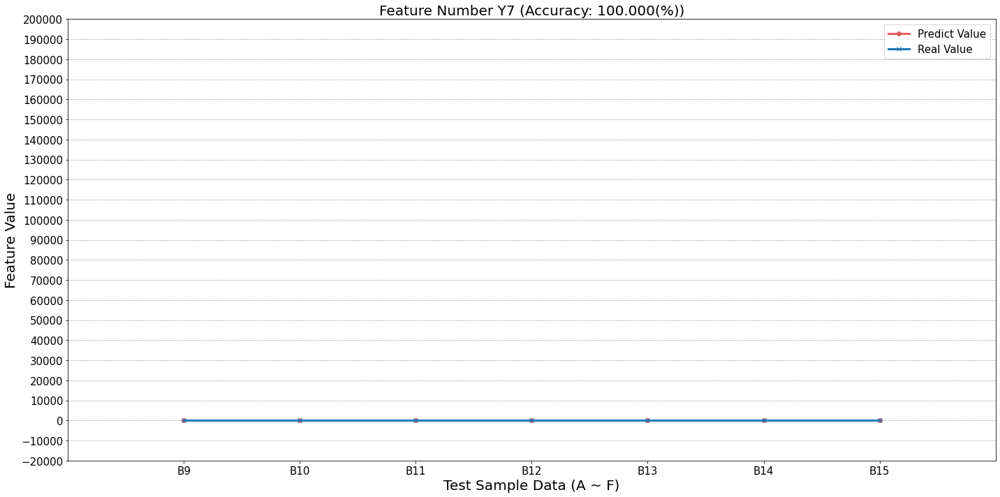

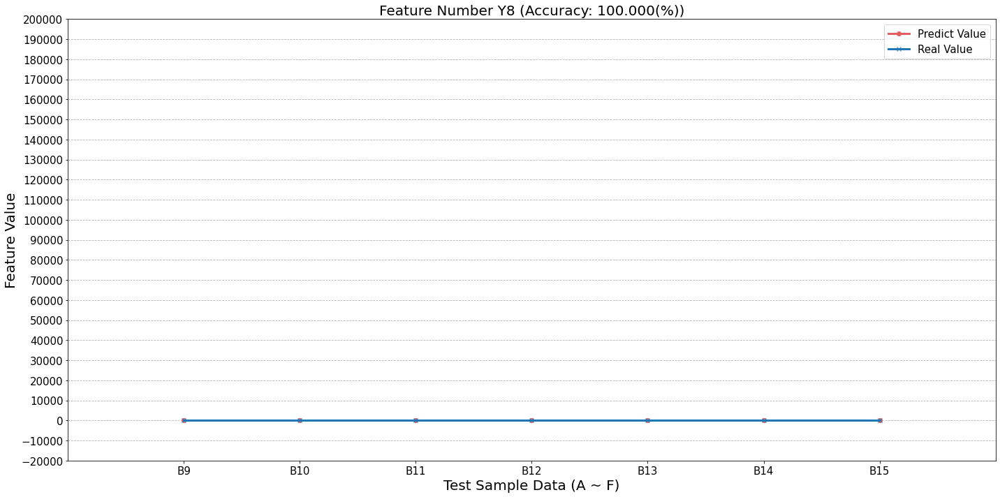

...

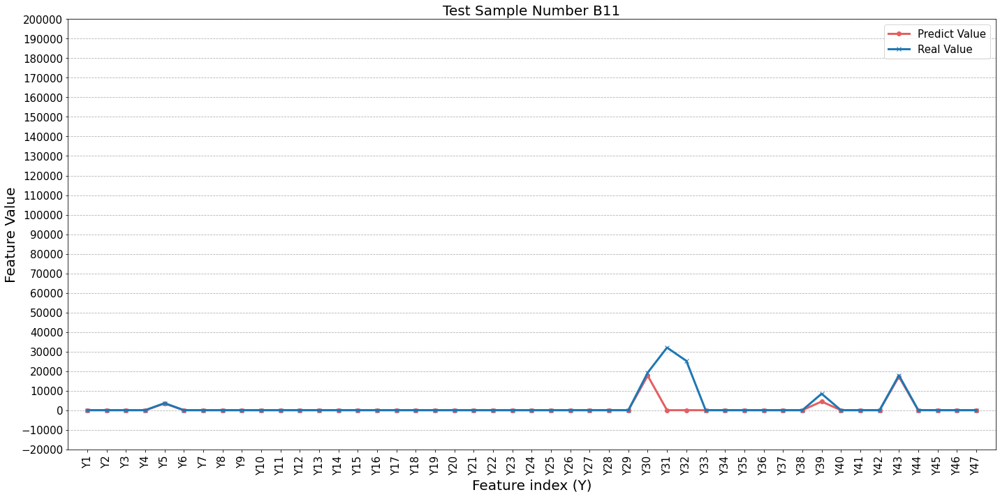

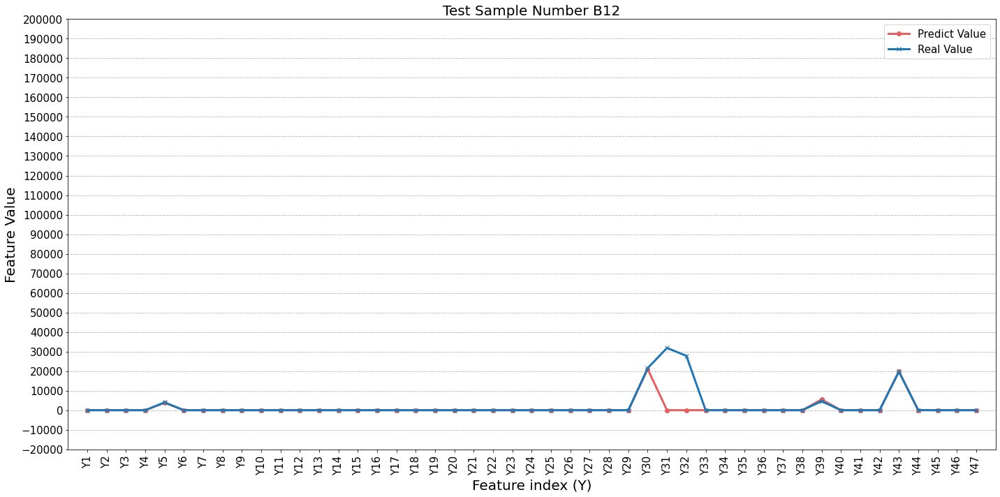

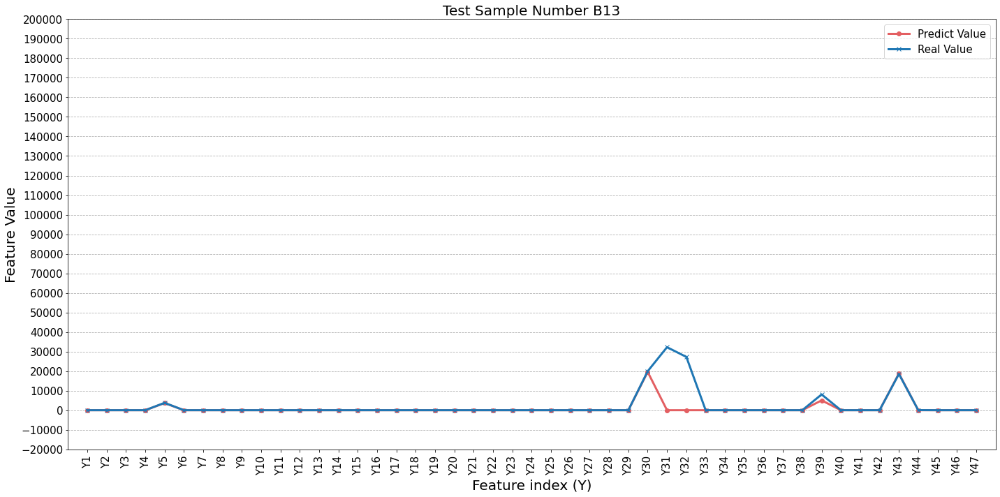

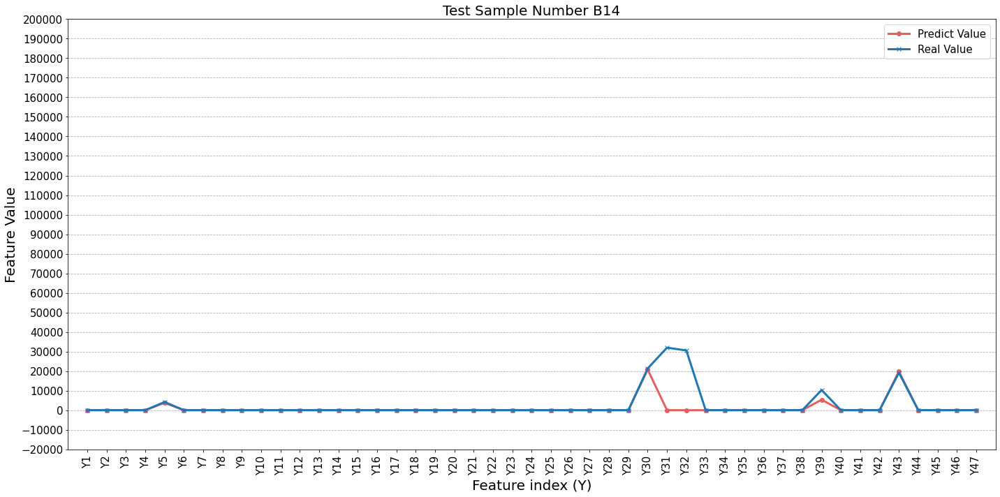

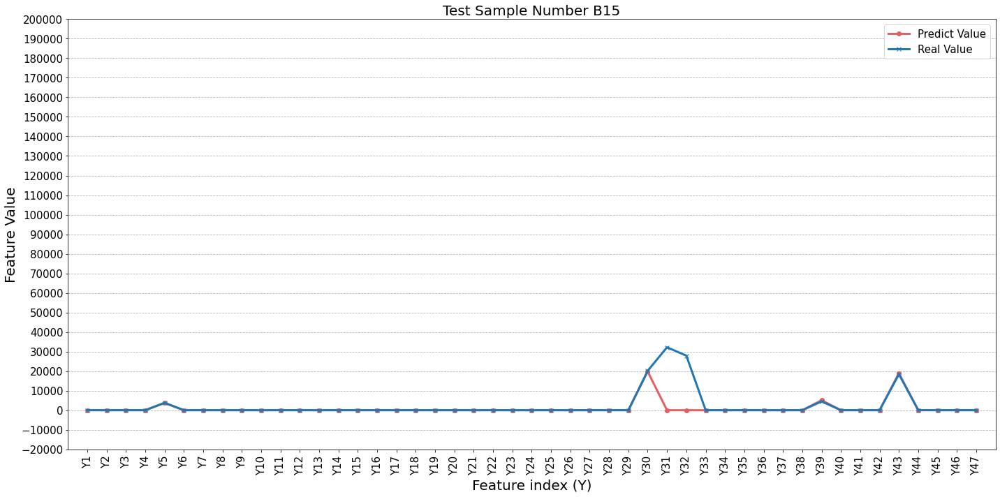

In [54]:
# B type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'B'

yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 4) Training the type 'C' data

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\C\cnn33\a

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


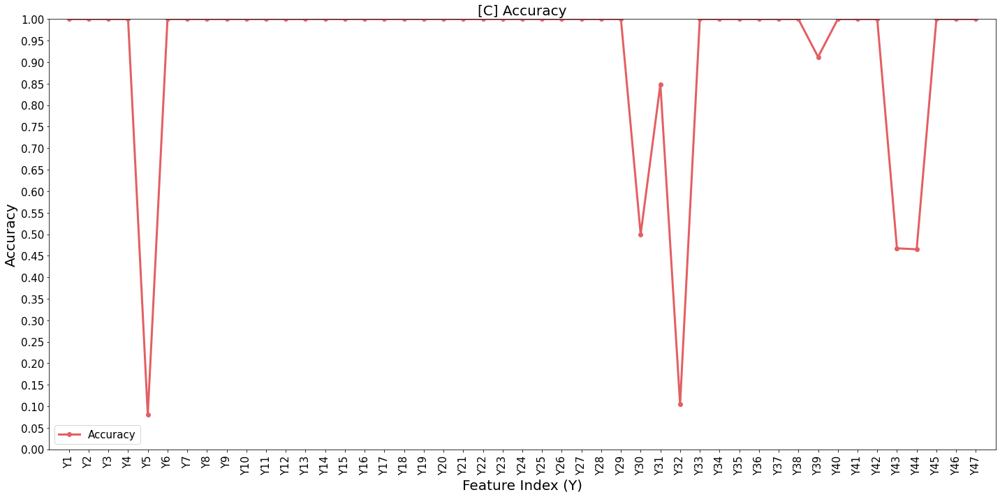

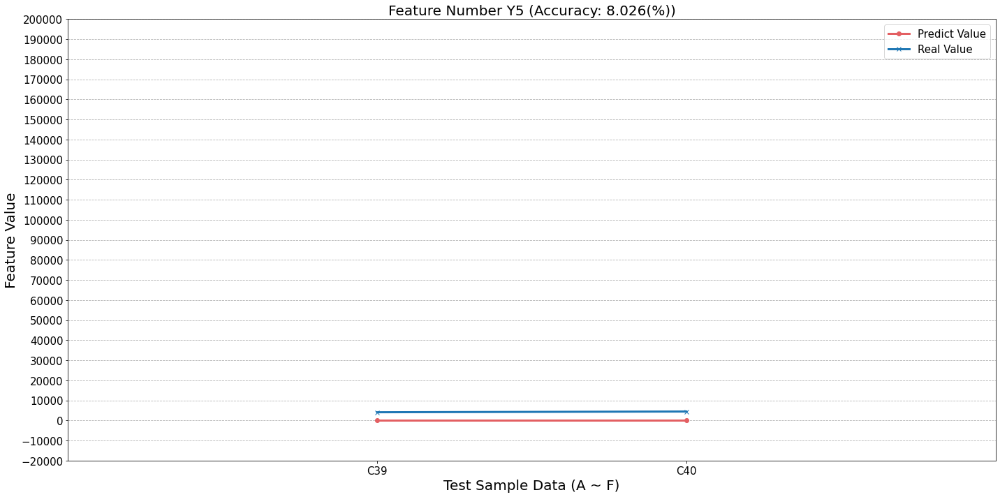

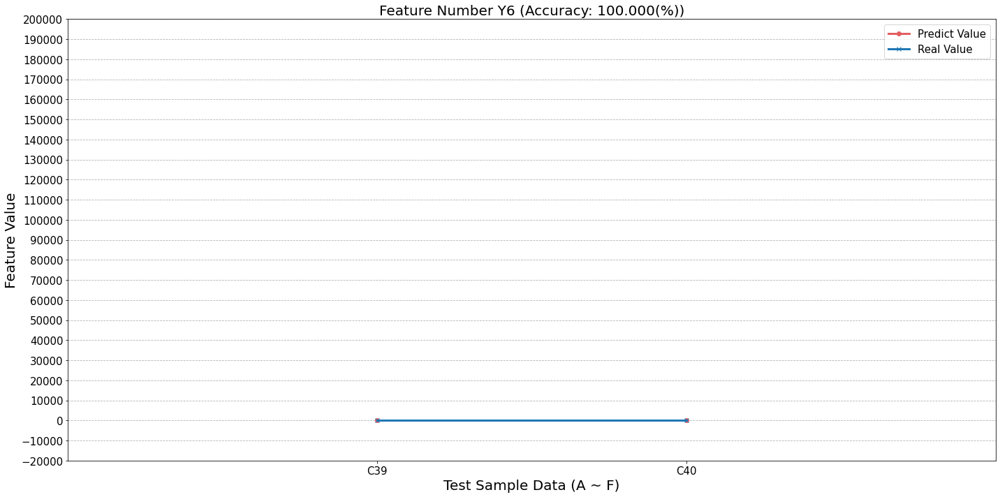

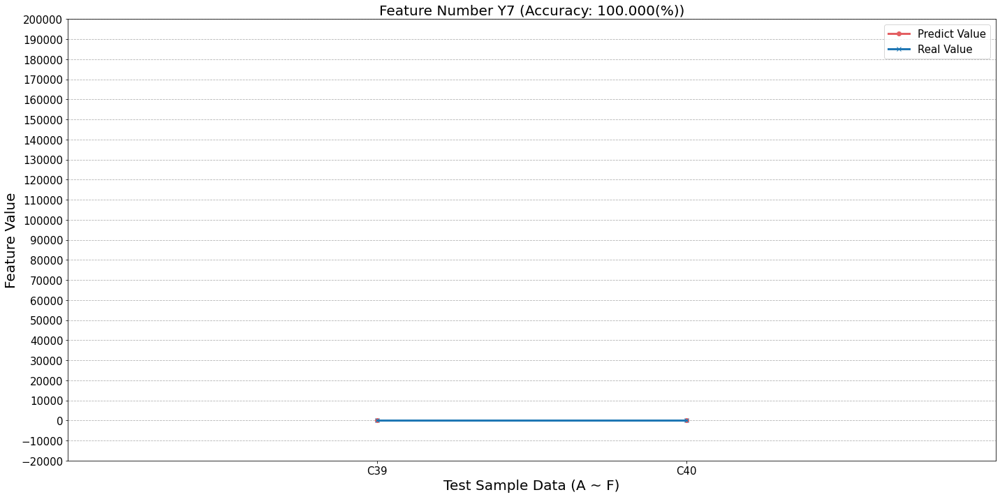

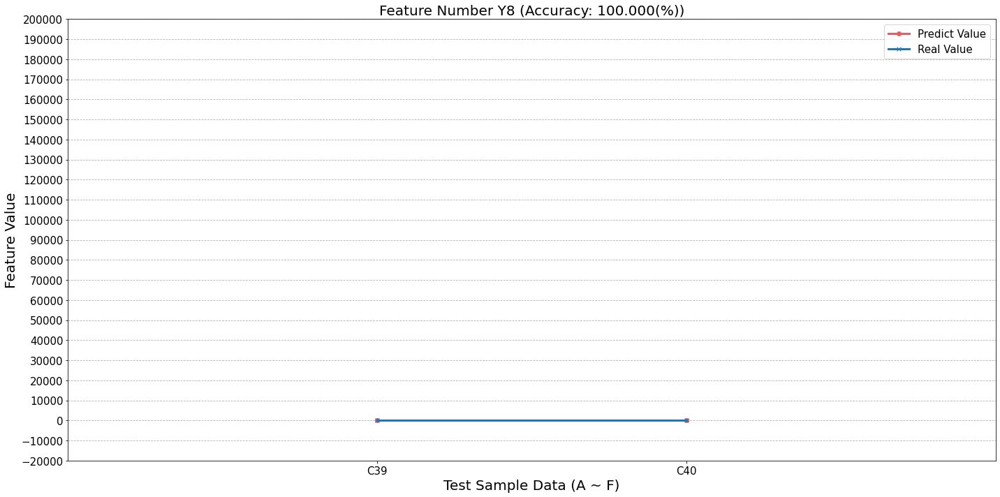

...

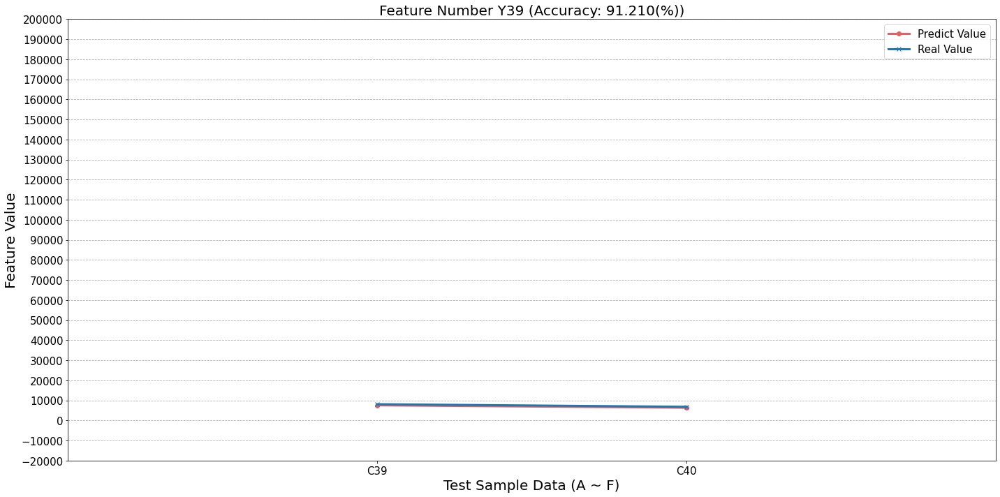

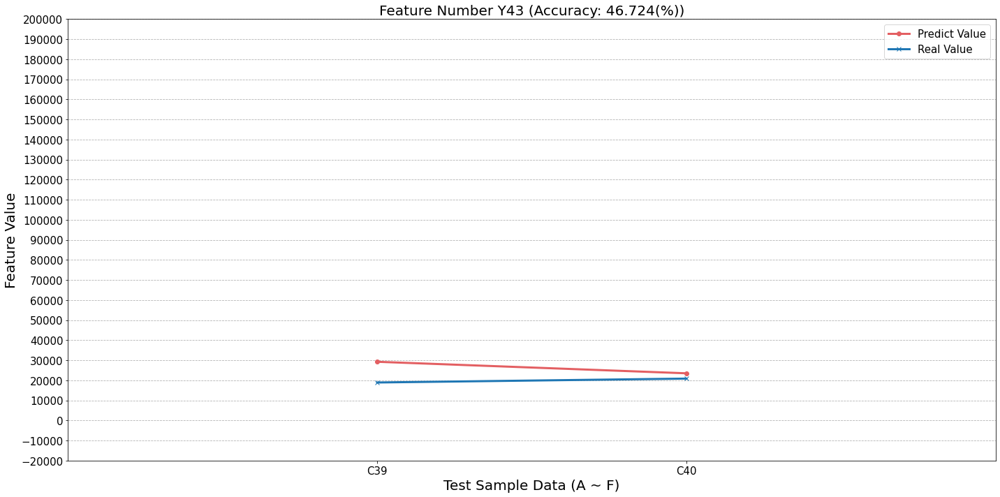

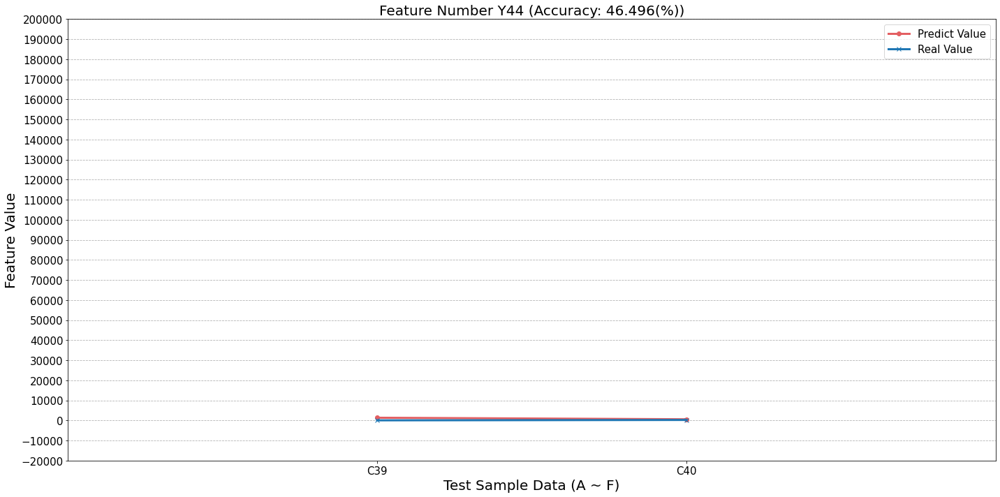

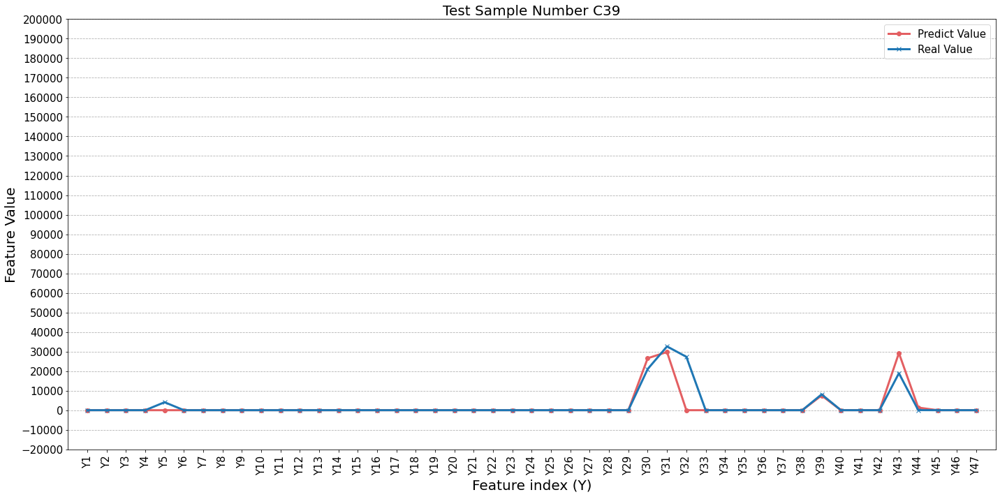

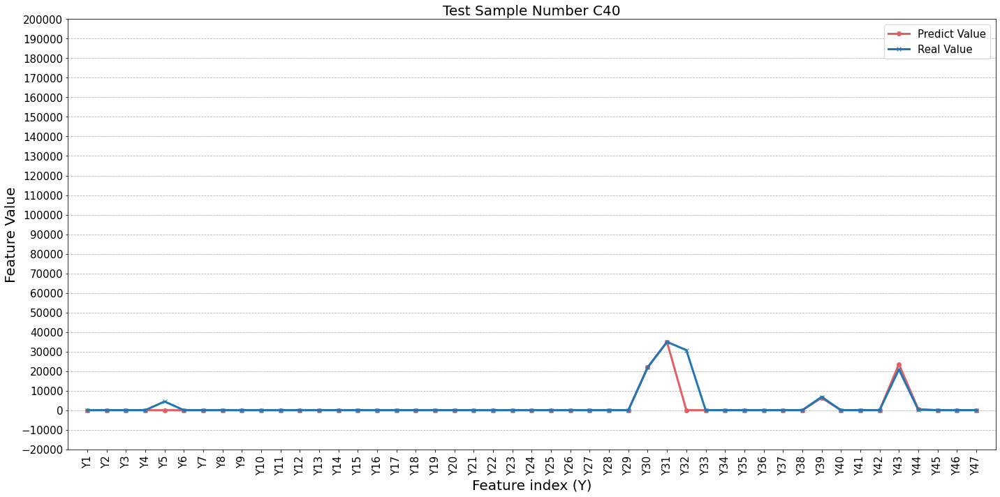

In [55]:
# C type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'C'

yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 5) Training the type 'D' data

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\D\cnn33\a

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


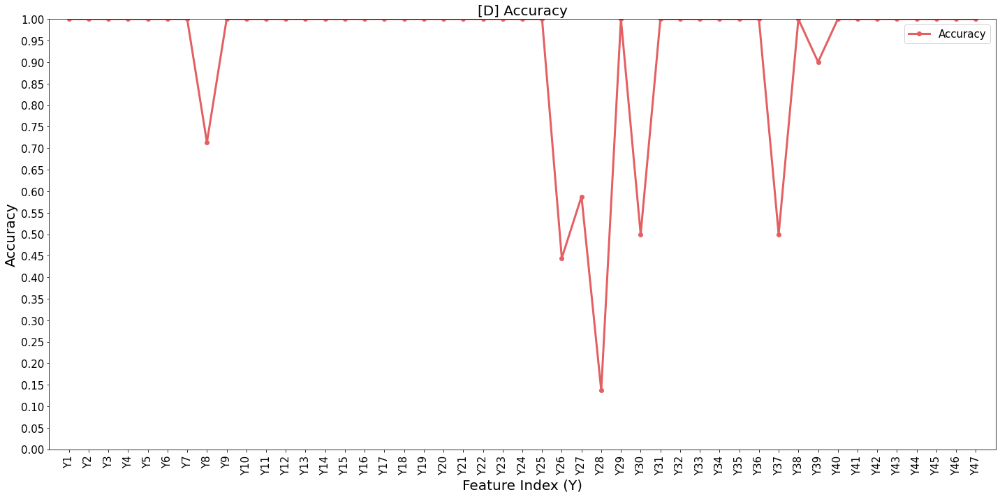

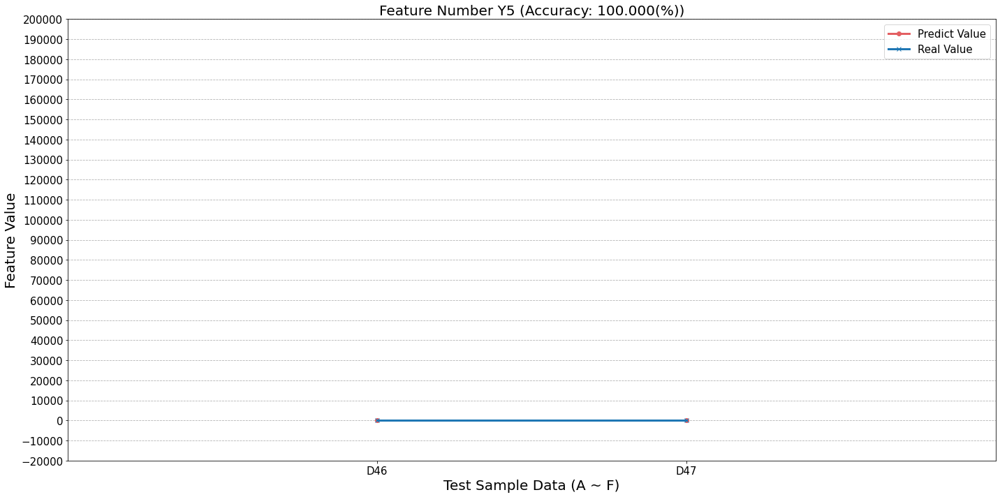

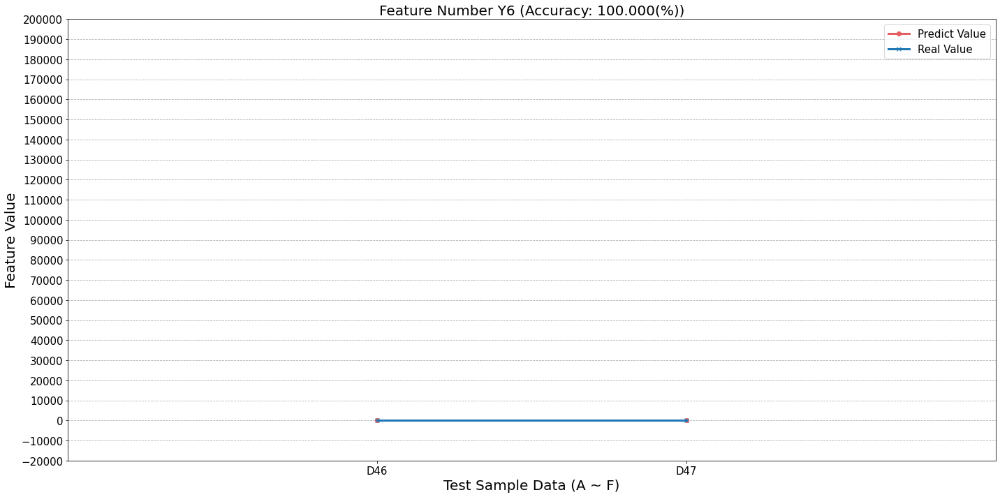

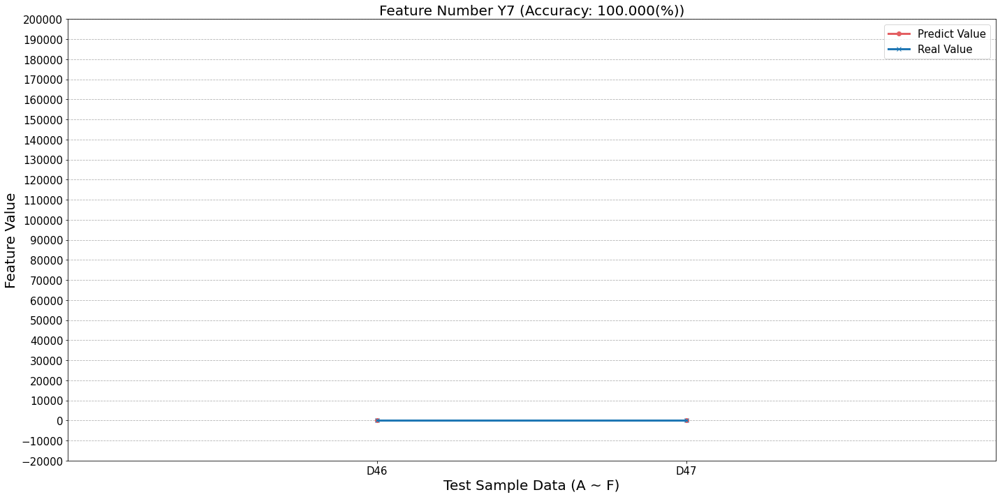

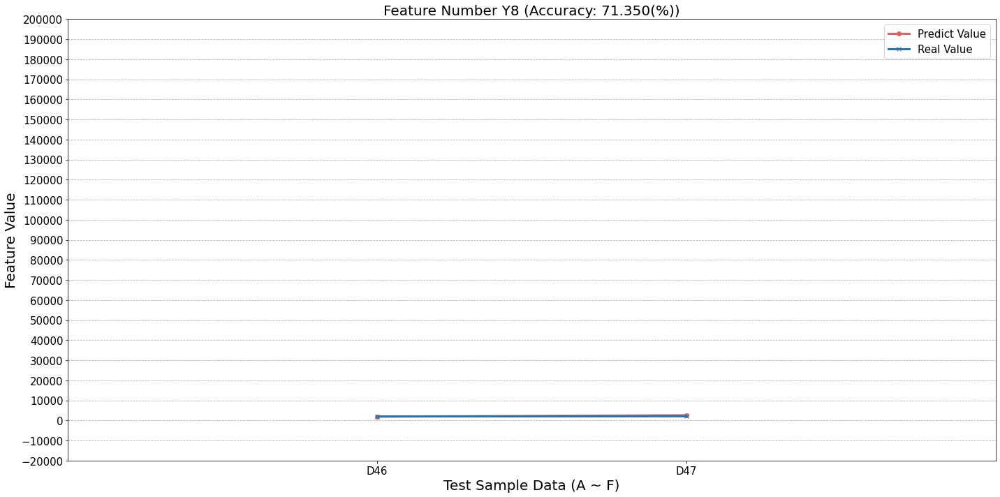

...

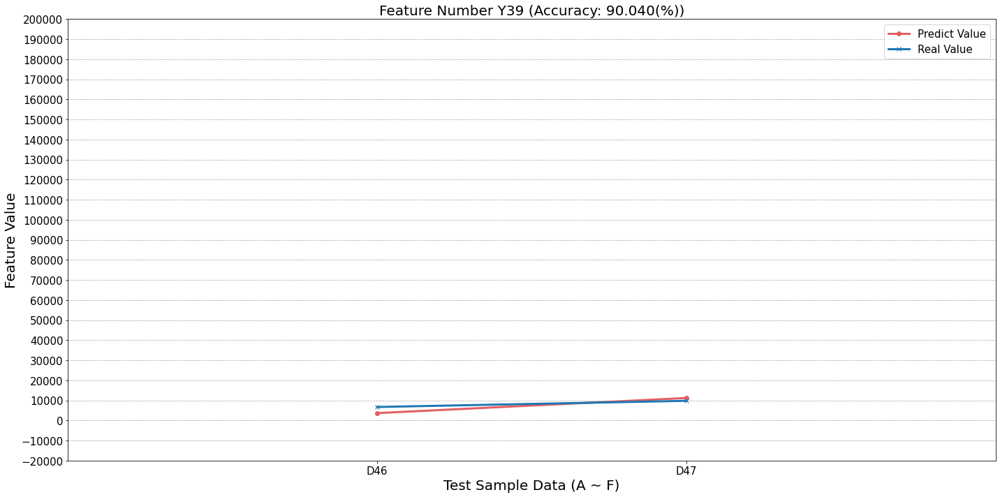

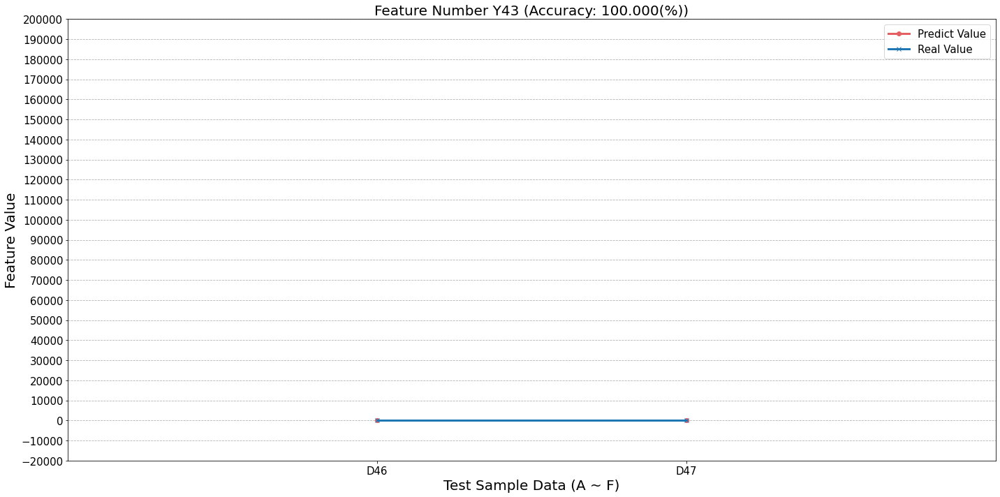

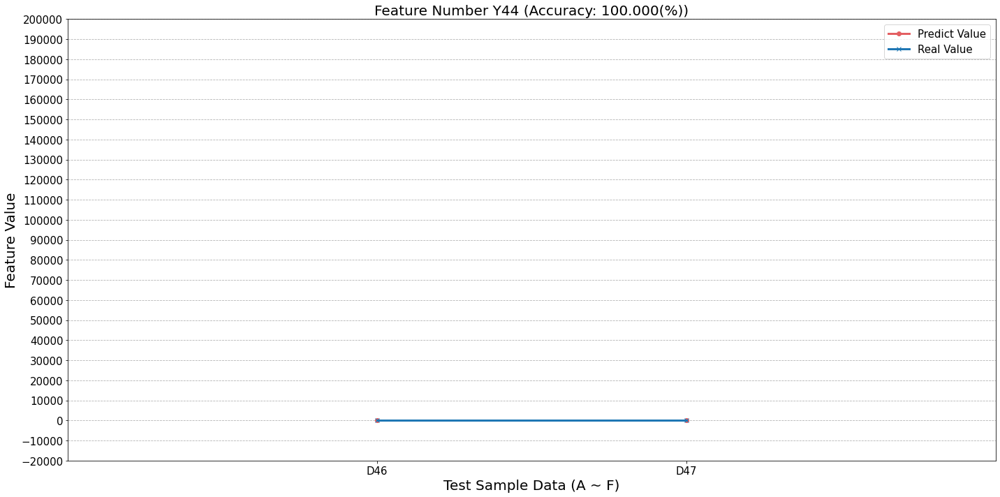

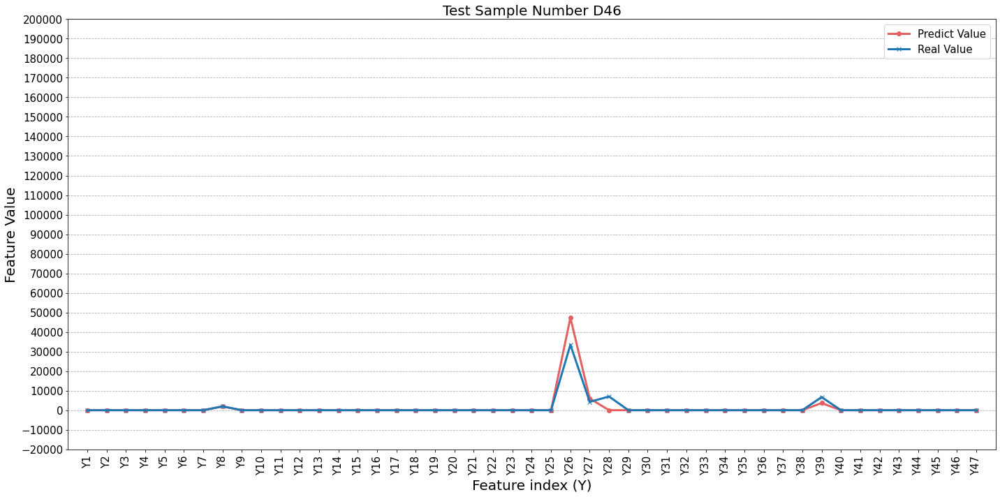

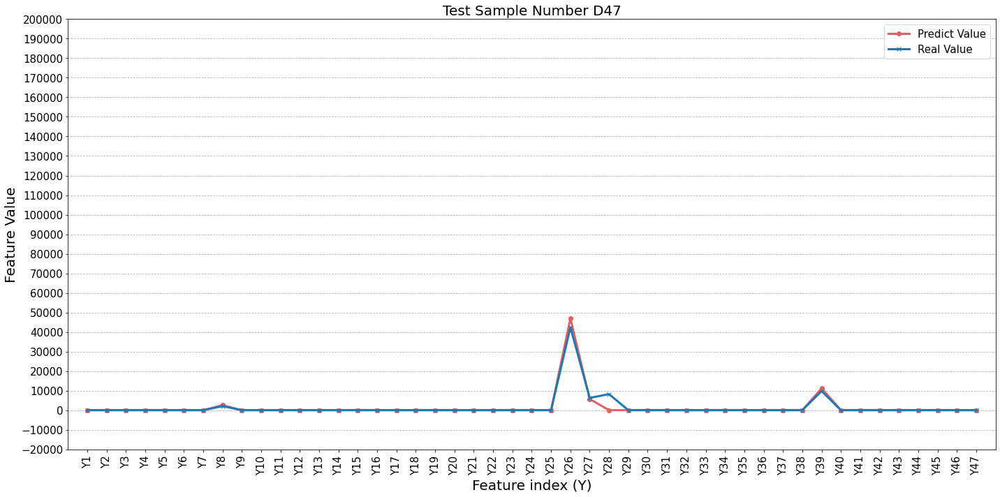

In [56]:
# D type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'D'

yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 6) Training the type 'E' data

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\E\cnn33\a

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


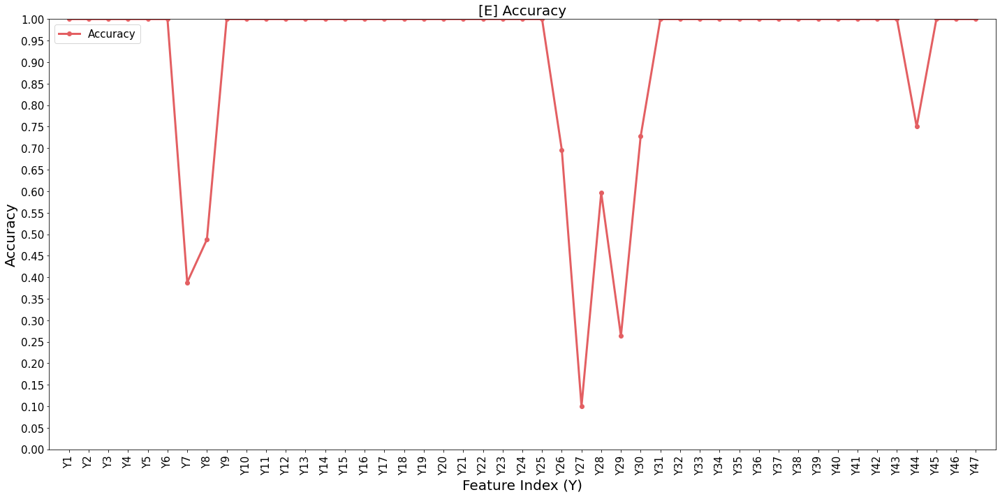

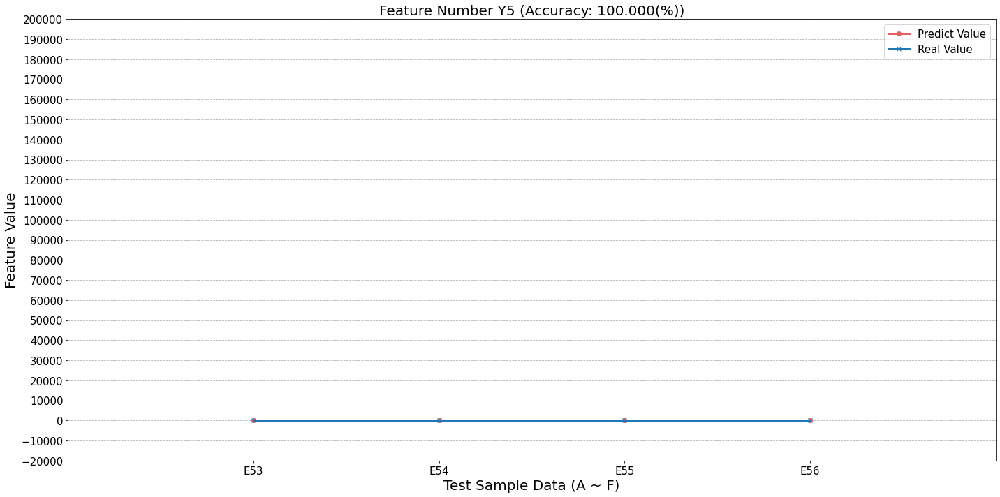

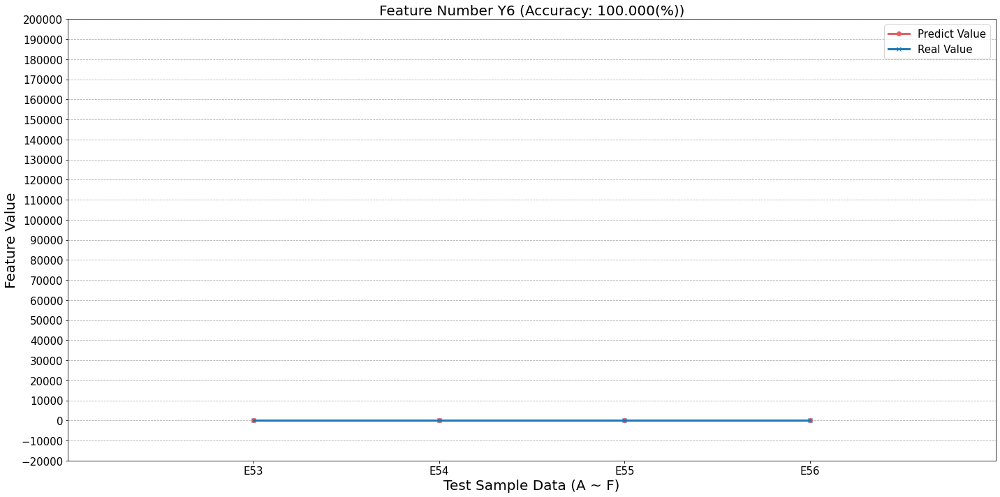

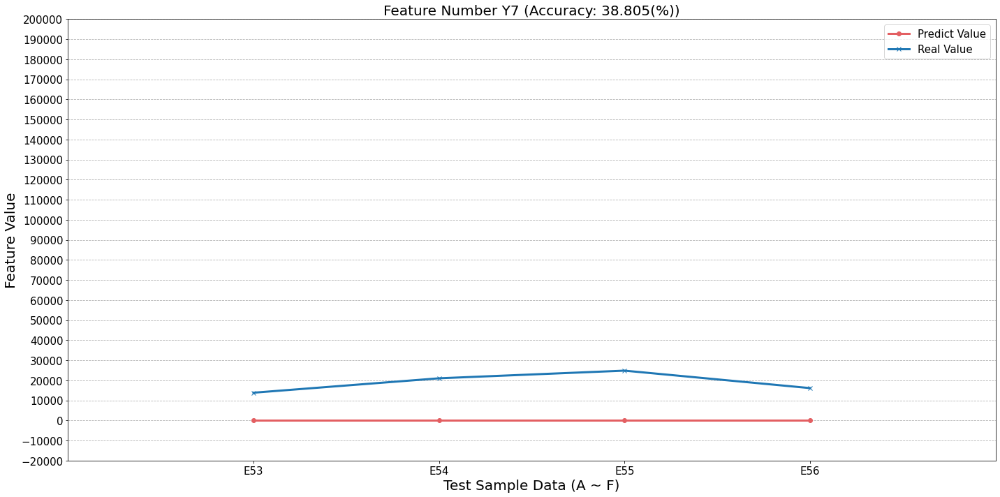

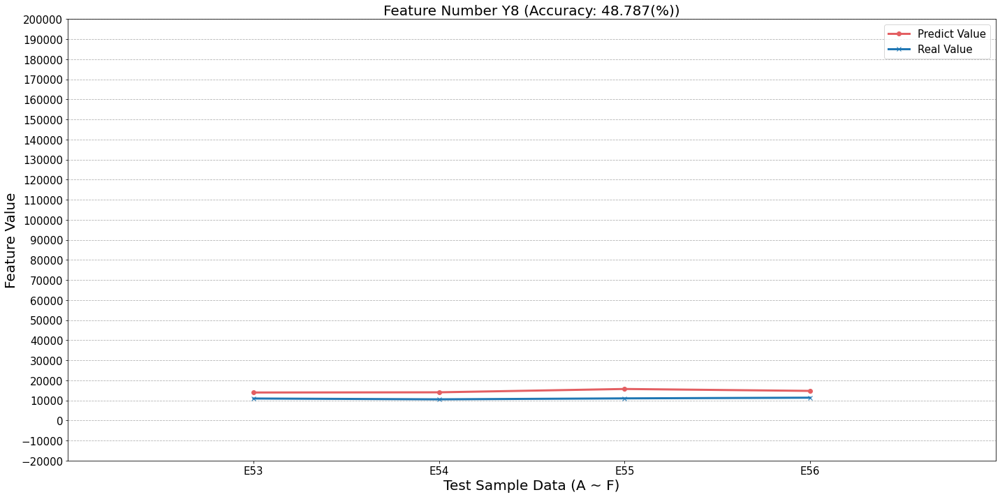

...

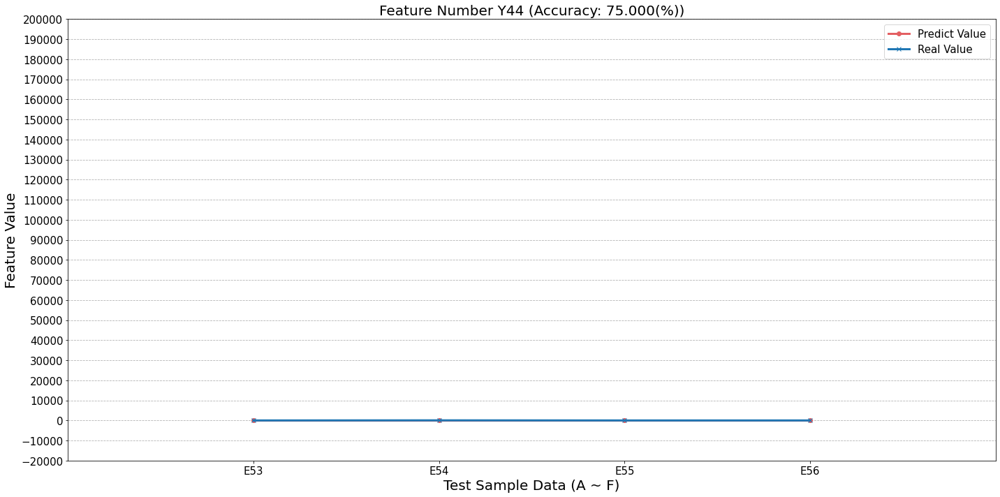

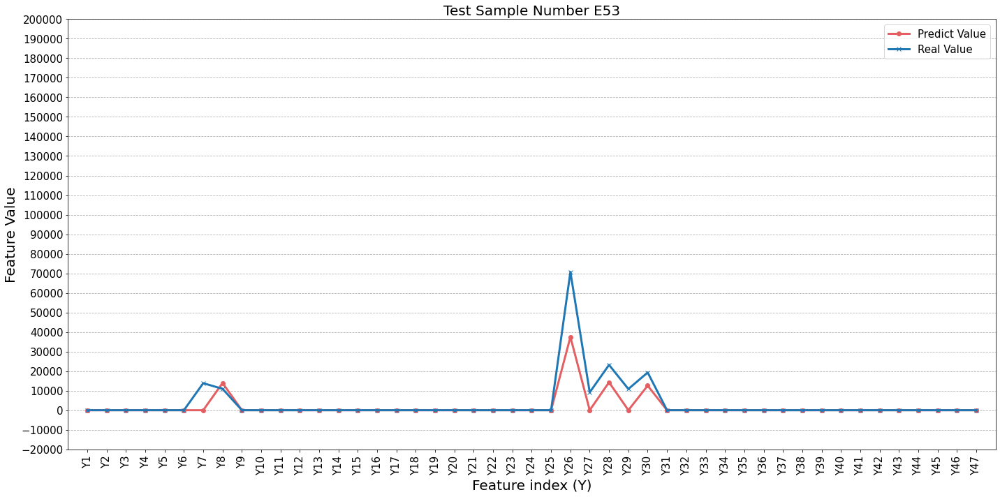

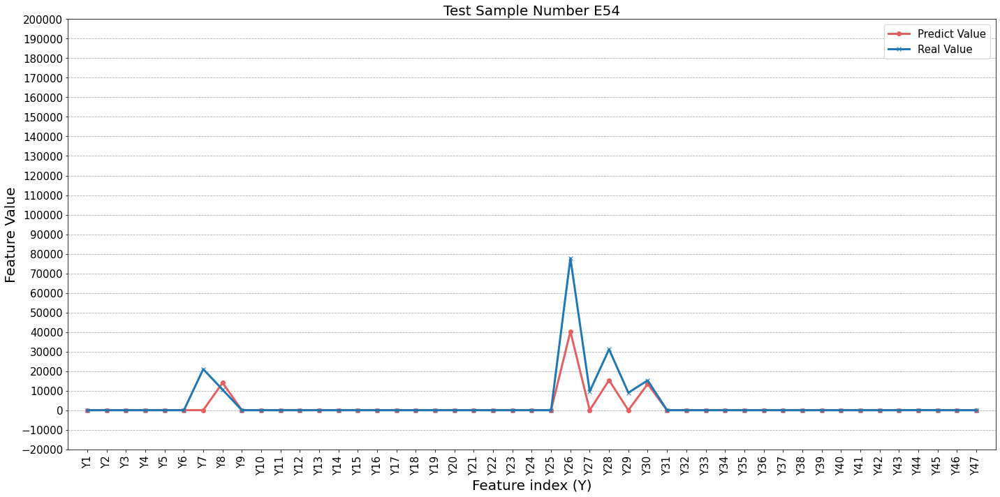

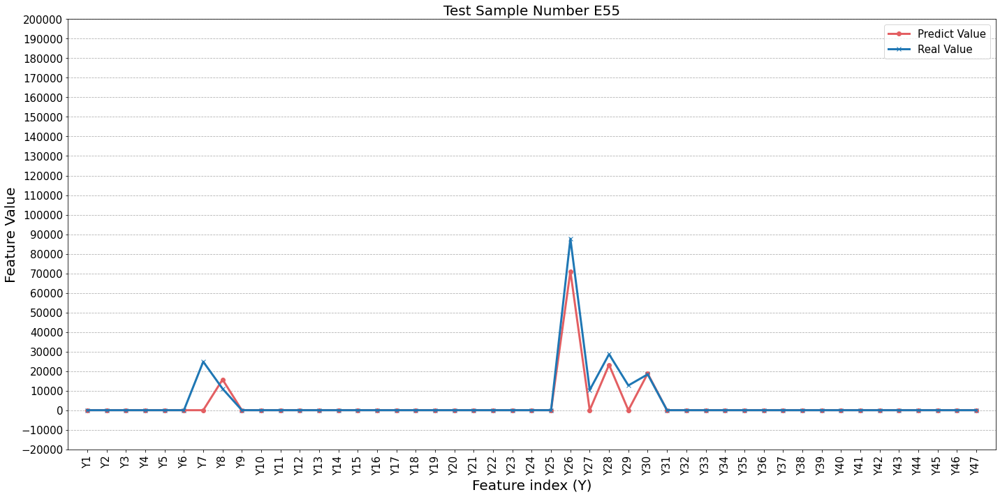

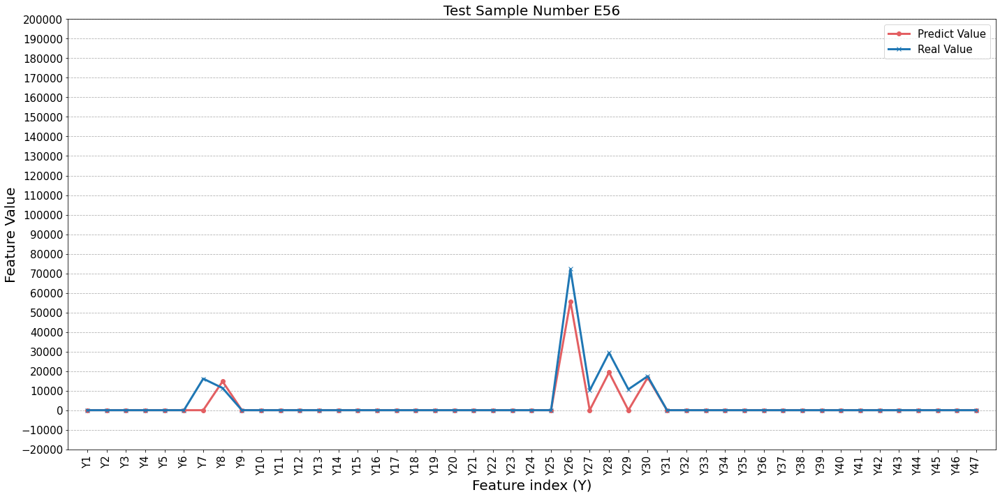

In [57]:
# E type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'E'

yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

## 7) Training the type 'F' data

process:  5
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn5\assets
process:  6
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn6\assets
process:  7
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn7\assets
process:  8
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn8\assets
process:  25
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn25\assets
process:  26
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn26\assets
process:  27
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn27\assets
process:  28
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn28\assets
process:  29
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn29\assets
process:  30
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn30\assets
process:  31
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn31\assets
process:  32
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn32\assets
process:  33
INFO:tensorflow:Assets written to: save_model\cnn\F\cnn33\a

<ipython-input-28-881ed2bdc76a>:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


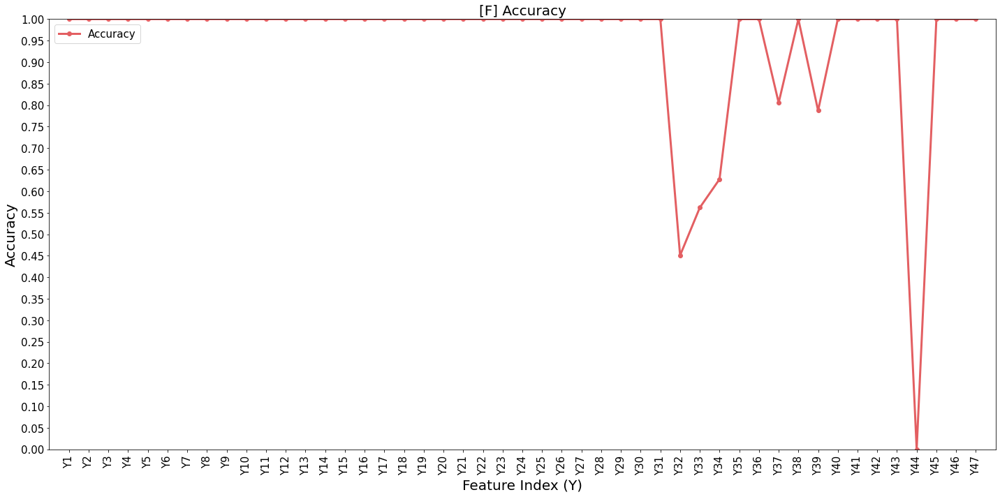

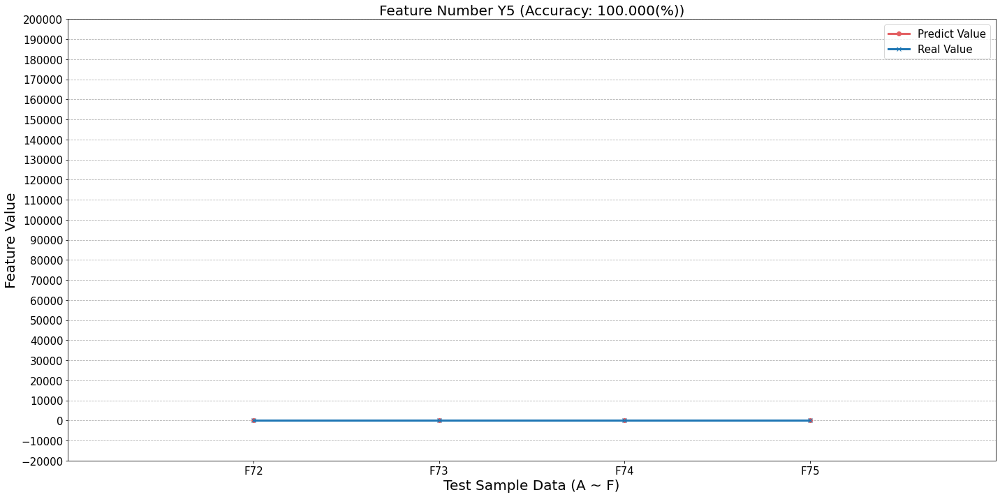

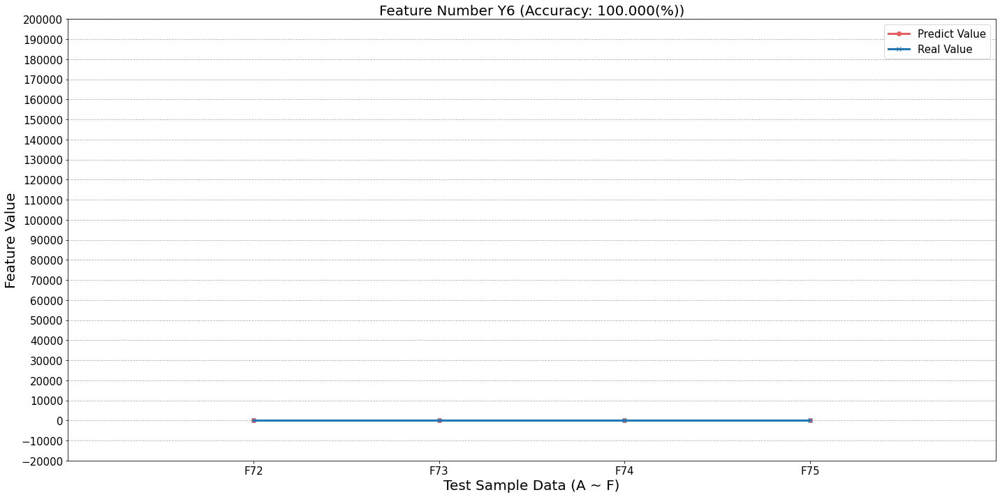

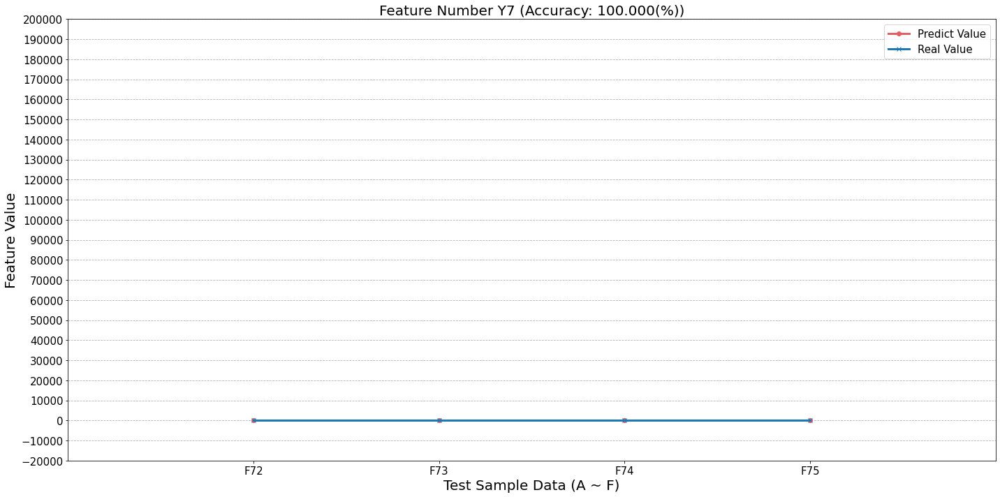

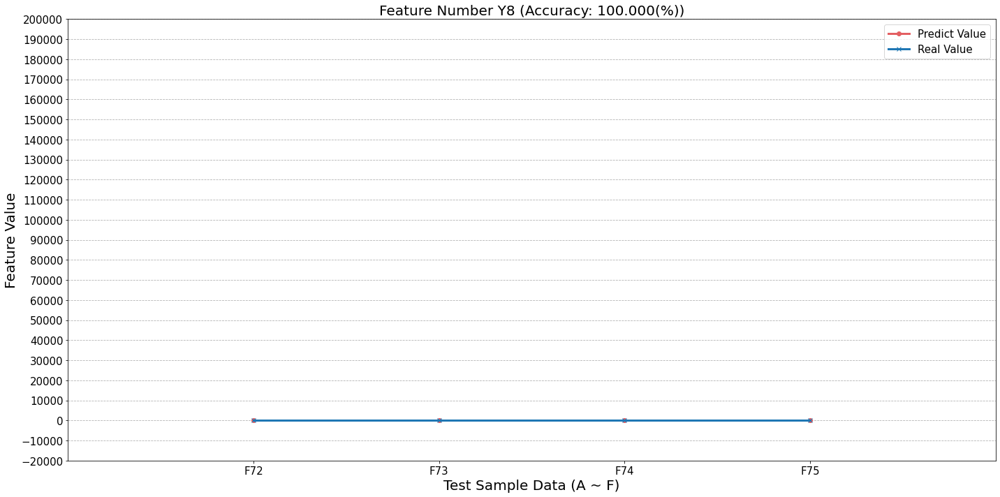

...

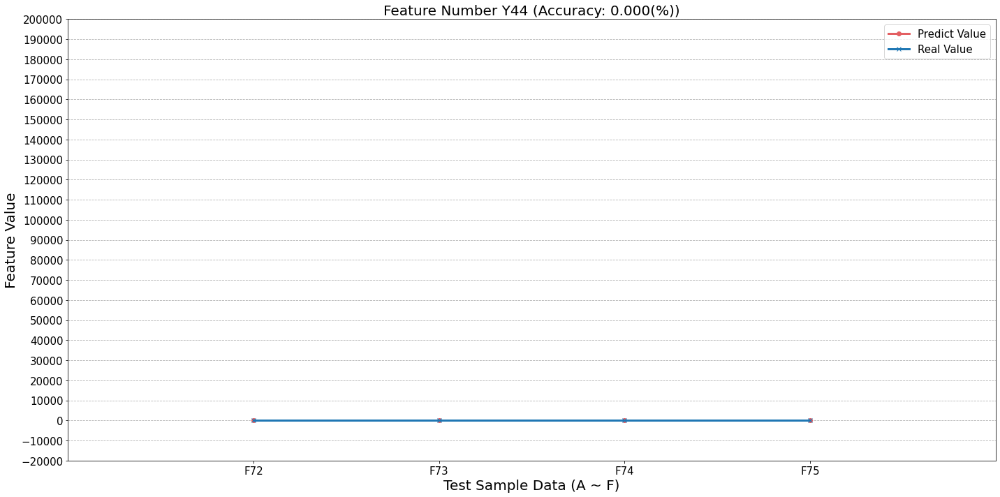

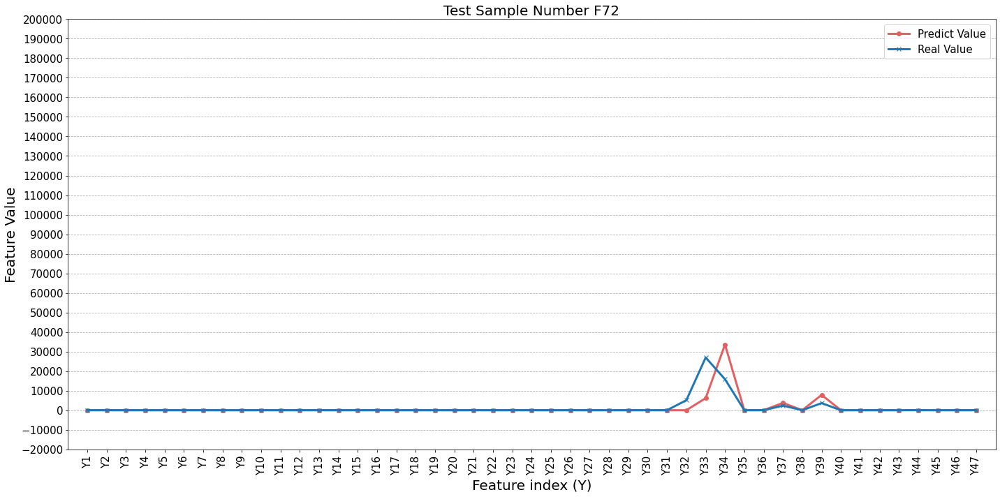

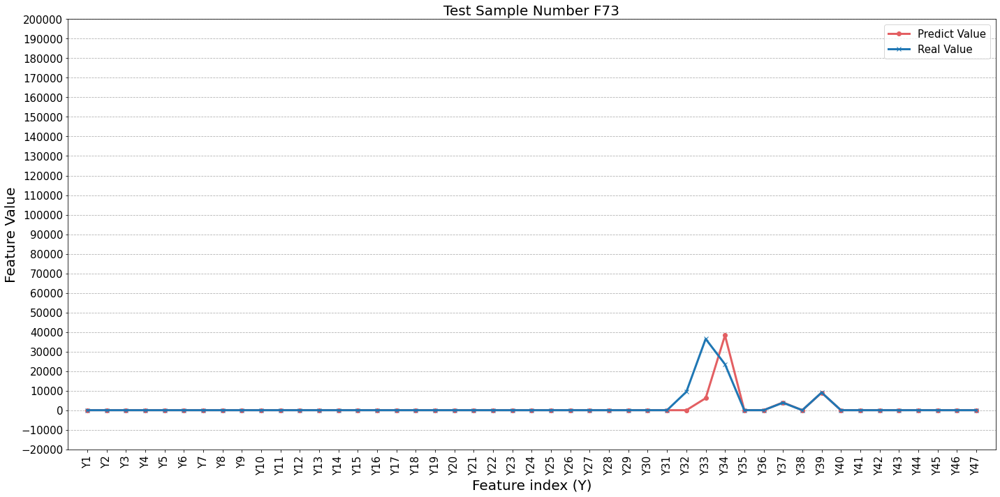

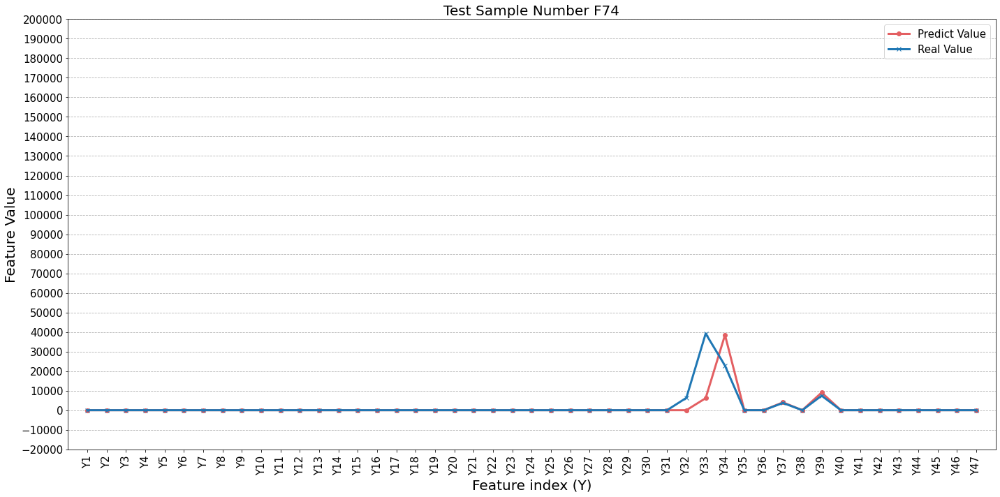

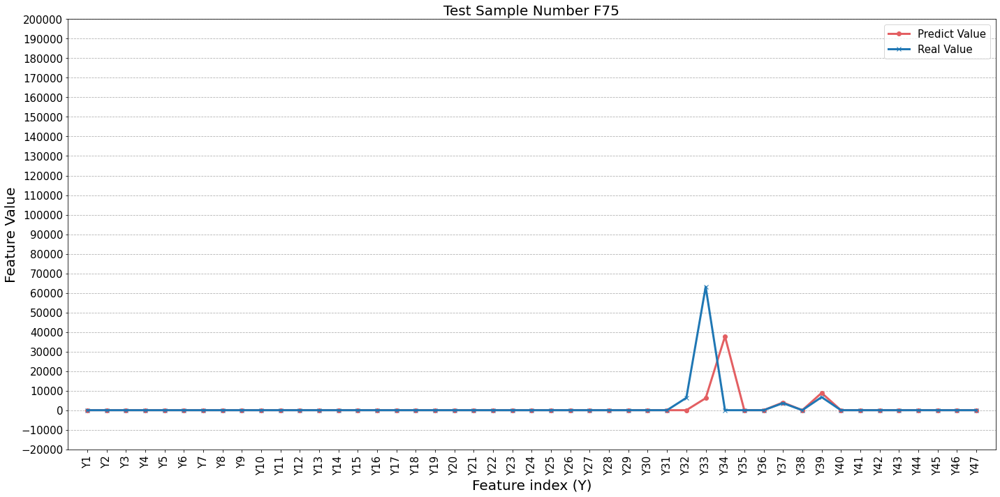

In [58]:
# F type
#############################################################
file = '../data_v2/DB(R0_H_R1 211012).xlsx'
model_type = "cnn"
type_data = 'F'

yhat, ytarget, acc = train(file, model_type=model_type, iscommon=False, type_data=type_data)
plot_accuracy(acc, type_data=type_data)
plot_y_value_for_test_data_number(ytarget, yhat, acc, type_data=type_data)
plot_y_value_for_y_feature_number(ytarget, yhat, acc, type_data=type_data)

In [34]:
%reload_ext tensorboard

In [35]:
%tensorboard --logdir logs/cnn --host localhost --port=6185

#tasklist | more
#netstat -ano | findstr :43172
#taskkill /PID 43172 /F

Reusing TensorBoard on port 6185 (pid 13548), started 20:52:12 ago. (Use '!kill 13548' to kill it.)